In [1]:
import numpy as np
import matplotlib.pyplot as plt
import time
import sys 
import os

import torch
import torch.nn as nn

import pandas as pd

import ase

import time
import argparse

from models.descriptors import DihedralDescriptors, DistanceDescriptors, CoordinateDescriptors

from models.basis_set_bias import BasisBias
from models.gaussian_models import GridGaussians

from simulator.simple_diff_md import simulateNVTSystem, simulateNVTSystem_adjoint, simulateNVTSystem_warmup
from simulator.descriptor_loss import DescriptorLoss
from simulator.trainer import train_epoch
from simulator.adjoint_provider import get_adjoints

from plotting.plot_intermediate import plot_intermediate

from scipy.stats import chi2

parser = argparse.ArgumentParser()
parser.add_argument("--seed", default=42, type=int, help="Random seed.")
parser.add_argument('--save_figs', action='store_true')
parser.add_argument('--no_adjoint', action='store_true')
parser.add_argument("--plot_every", default=1, type=int, help="When to plot figures.")

# Main simulation parameters
# Descriptor loss
parser.add_argument("--iterations", default=6000, type=int, help="Number of iterations to generate training data.")
parser.add_argument("--warmup", default=200, type=int, help="Warm-up period for the trajectory termalization")
parser.add_argument("--backsteps", default=190, type=int, help="Number of backsteps. Must be smaller as warmup")
parser.add_argument("--plot_nth", default=10, type=int, help="Plotting every nth point.")


parser.add_argument("--batch_size", default=300, type=int, help="Batch size.")
parser.add_argument("--epochs", default=100, type=int, help="Number of training epochs.")
parser.add_argument("--save_steps", default=1, type=int, help="When to save tensor")
parser.add_argument("--dt", default=1.0, type=float, help="Timestep in fs")
parser.add_argument("--barrier", default=1.0, type=float, help="Barier size.")
parser.add_argument("--bias", default="gauss", type=str, help="Biased potential")
parser.add_argument("--dimension", default=2, type=int, help="Biased potential")
parser.add_argument("--neurons", default=150, type=int, help="Neurons in a net")
parser.add_argument("--loss", default="quad", type=str, help="Quadratic function")
parser.add_argument("--p_in_domain", default=0.1, type=float, help="Tolerance to it the target.")

#Simulation controls
parser.add_argument("--temperature", default=10, type=float, help="System temperature.")
parser.add_argument("--gamma", default=0.1, type=float, help="Friction in langevin.")

#Training parameters
parser.add_argument("--learning_factor", default=20.0, type=float, help="Learning rate.")
parser.add_argument("--mini_batch", default=120, type=int, help="Mini batch")
parser.add_argument('--use_non_batched', action='store_true')
parser.add_argument('--device', default="cuda:0", type=str, help="Which device to use. CPU or GPU?")
parser.add_argument('--save_every_model', default=1, type=int, help="When to save the bias potential")
args = parser.parse_args("")

args.save_figs = True

/home/sipkam/anaconda3/envs/torchmdCUDA/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
#Define som runtimes stuff    
if args.save_steps > 1:
    raise NotImplemented("Feature not yet implemented and tested")

args.warmup = args.warmup//args.save_steps
args.backsteps = args.backsteps//args.save_steps

#Distance d - arg of normal distribution follows chi2. We therefore consult scipy package and its chi2
#implementation to get the actual d**2 tolerance so that P(x in X) >= p where p defined in args

args.domain_tol = chi2.isf(args.p_in_domain, args.dimension)

#The numerical stability factor. Adjoints tend to be too small and numerical accuracy is an issue. 
adjoint_multiplier = 1e4


assert args.iterations > 3* args.warmup
assert args.backsteps < args.warmup
torch.manual_seed(args.seed)

if args.no_adjoint:
    forward_simulate = simulateNVTSystem
else:
    forward_simulate = simulateNVTSystem_adjoint


first_checkpoint = False
first_thr = 0.51
second_checkpoint = False
second_thr = 0.71
#third_checkpoint = True
#fourth_checkpoint = True


args.folder = "resultsMB/"+args.loss+args.bias+ "D" + str(args.dimension)+"I:"+str(args.iterations) \
    + "N"+ str(args.neurons) + "dt" + str(args.dt) + "T" + str(args.temperature) + "g" \
    + str(args.gamma) +"/"
isExist = os.path.exists(args.folder)

if not isExist and (args.save_figs or args.save_every_model > 0):
    os.makedirs(args.folder)
    print("making folder")

making folder


In [3]:
#Cell to design descriptors. 

if args.dimension == 2:
    project_to = torch.tensor([0,1])
elif args.dimension == 5:
    project_to = torch.tensor([0,2])

In [4]:
from simulator.system import ToySystem
from models.simpleMB import SimpleMB
from functorch import vmap, jvp, vjp, grad


potential = SimpleMB(args, n_in=args.dimension)

M = 0.1*torch.ones(1, args.dimension)
system = ToySystem(args.dimension, nreplicas=2*args.batch_size, masses=M, device=args.device)
system.set_positions(potential.get_init_point(args.batch_size))


In [5]:
#Define initialization and setup the run
from simulator.utils import maxwell_boltzmann, kinetic_energy, kinetic_to_temp, temp_to_kin

desired_kin = temp_to_kin(300, args.dimension)
    
def get_init_point(steps = 300):

    system.set_positions(potential.get_init_point(args.batch_size))
    system.set_velocities(maxwell_boltzmann(system.M, args.temperature, args.dimension, replicas=2*args.batch_size))
    kin = kinetic_energy(system.M, system.vel)

    factor = torch.sqrt(desired_kin/kin).reshape(-1,1).repeat(1,args.dimension)
    system.vel = system.vel*factor

    system.to_(args.device)
    #Pass a vmap on the non-biased forces
    simulateNVTSystem_warmup(system, vmap(potential.force_func), args, steps=steps)
    
    kin = kinetic_energy(system.M, system.vel)

    start, end = system.pos.detach().chunk(2,dim=0)
    return system, torch.cat((start, end)), torch.cat((end, start))


get_init_point(10)
#Pass a vmap on a non-biased force
pos_list = simulateNVTSystem_warmup(system, vmap(potential.force_func), args, steps=4200)
#Stack the list of points and split into reactant trajs and product trajs
pos_list = torch.stack(pos_list, axis=1)
react_pos = pos_list[:args.batch_size]
prod_pos = pos_list[args.batch_size:]

coordinate_descriptors = CoordinateDescriptors()

domain = {}
domain["Lx"], domain["Hx"] = 10, 50
domain["Ly"], domain["Hy"] = 0, 40
domain["res"] = 100

torch.Size([100, 100])


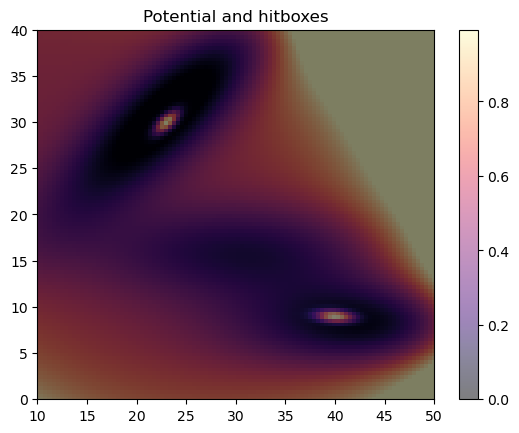

In [6]:
#Get initial descriptors and estimate variance in them. 
from simulator.cov_estimator import get_covariance

reactant_target = potential.initial_point
product_target = potential.final_point

react_var_inv, prod_var_inv = get_covariance(react_pos, prod_pos, reactant_target, product_target,
                                             coordinate_descriptors, domain, args, potential)

In [7]:
if args.bias == "gauss":
    height = 0.01
    resolution = 50
    var = 3**2
    sample_bias_force = GridGaussians(height, args.dimension, -10, 55, resolution, var=var, descriptors=coordinate_descriptors, device=args.device)
    if args.use_non_batched or args.no_adjoint:
        lr = 0.001/adjoint_multiplier
    else:
        lr = 50*args.learning_factor/adjoint_multiplier/args.batch_size/10 
        
if args.bias == "descriptor_basis":   
    
    height = 0.01
    resolution = 50
    var = 25/10
    sample_bias_force = BasisBias(height,args.dimension, -5, 55,
                                       resolution=resolution, var=var, neurons=args.neurons,
                                       descriptors=coordinate_descriptors, device=args.device)
    if args.use_non_batched or args.no_adjoint:
        lr = 0.1/adjoint_multiplier
    else:
        lr = args.learning_factor/adjoint_multiplier/args.batch_size         
    
    
sample_bias_force.to(args.device)
   
#Adam optimizer seems to work the best
optimizer = torch.optim.Adam(sample_bias_force.parameters(), lr=lr)

#Since we update scheduler only 
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.3)

#Descriptors
descriptor_loss = DescriptorLoss(coordinate_descriptors, react_var_inv, prod_var_inv, args)

def sample_total_force(R):
       
    Epot, f_U = potential.force_func(R)   
    f_b = sample_bias_force.force_func(R)
    return f_U + f_b

def get_forces_vjp(R, vec):
    (_, vjpfunc) = vjp(sample_total_force, R)
    grad = vjpfunc(vec)[0]
    return grad


vmaped_force = vmap(sample_total_force)
vmaped_vjp = vmap(get_forces_vjp)

In [8]:
#Setup a logger
from torchmd.utils import LogWriter

logger = LogWriter(path=args.folder, keys=('iter','loss_fwd','loss_s','lr','success'), name='training.csv')

Writing logs to  resultsMB/quadgaussD2I:6000N150dt1.0T10g0.1/training.csv


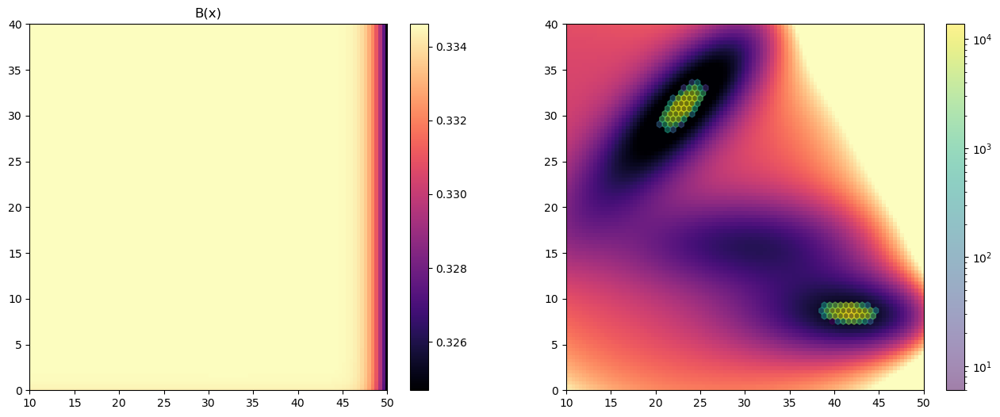

Iter:  1 l_f: 430233.1392 l_s: 0.0 lr:  3.3333333333333335e-05 success:  0.0


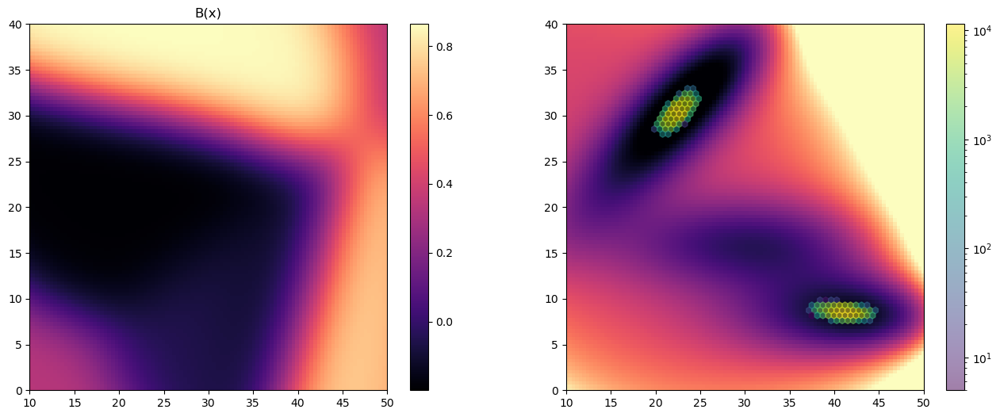

Iter:  2 l_f: 405053.1328 l_s: 0.0 lr:  3.3333333333333335e-05 success:  0.0


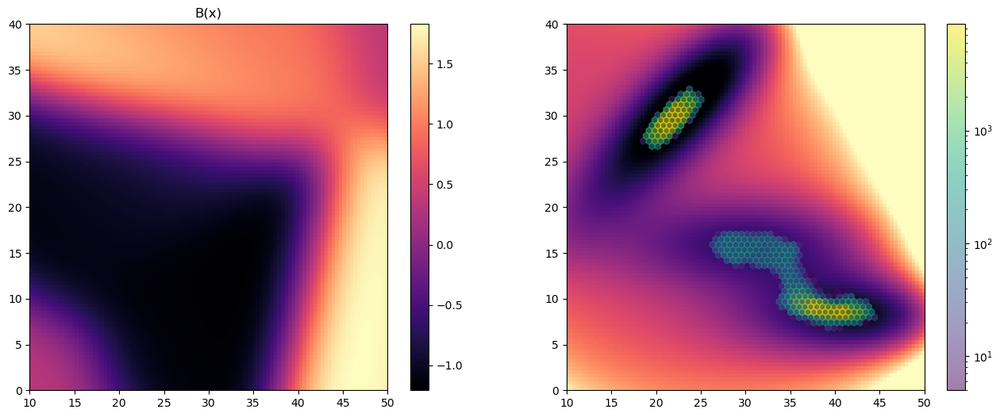

Iter:  3 l_f: 282731.3664 l_s: 0.0 lr:  3.3333333333333335e-05 success:  0.0


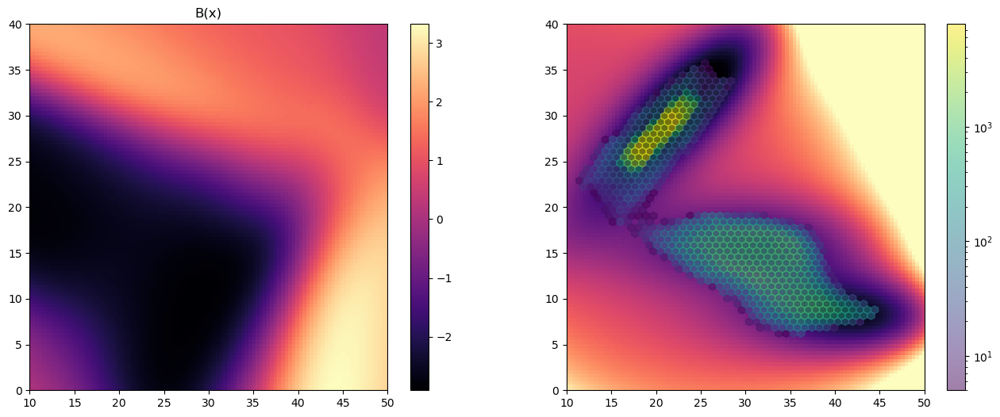

Iter:  4 l_f: 58825.0304 l_s: 1687.8066 lr:  3.3333333333333335e-05 success:  0.026666667


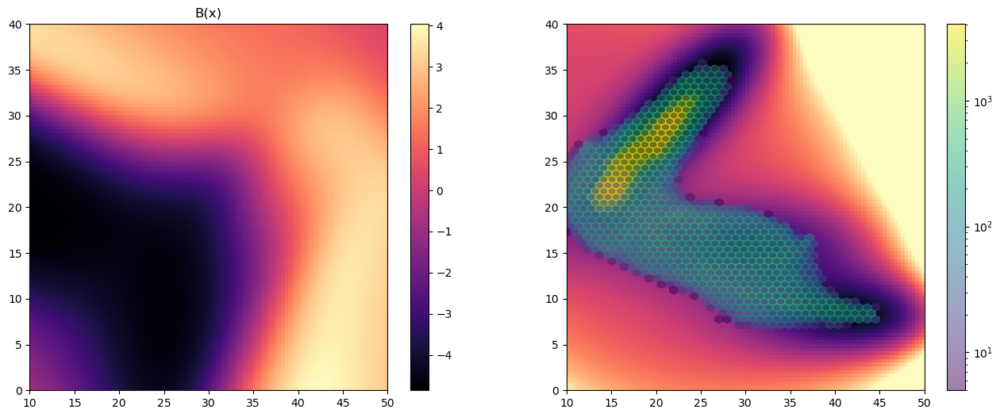

Iter:  5 l_f: 211931.4816 l_s: 5892.5176 lr:  3.3333333333333335e-05 success:  0.415


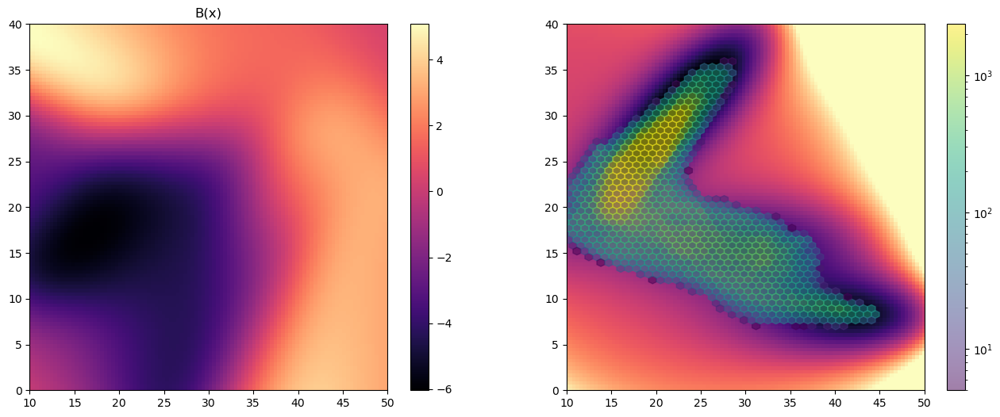

Iter:  6 l_f: 170578.5472 l_s: 7646.0392 lr:  3.3333333333333335e-05 success:  0.47666666


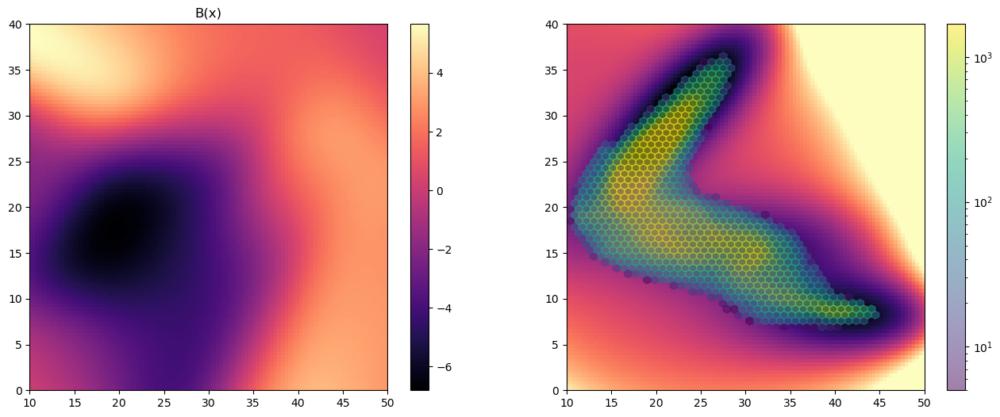

Iter:  7 l_f: 65131.7056 l_s: 4594.6512 lr:  3.3333333333333335e-05 success:  0.48


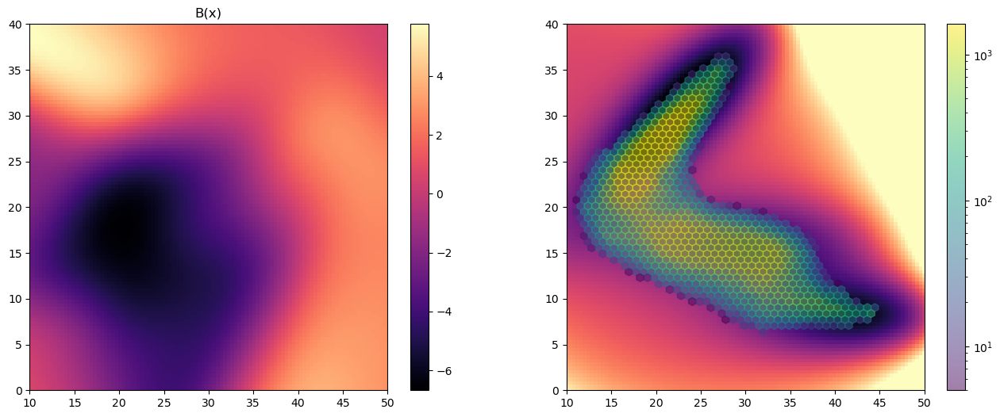

Iter:  8 l_f: 67116.9152 l_s: 6809.3296 lr:  3.3333333333333335e-05 success:  0.49166667


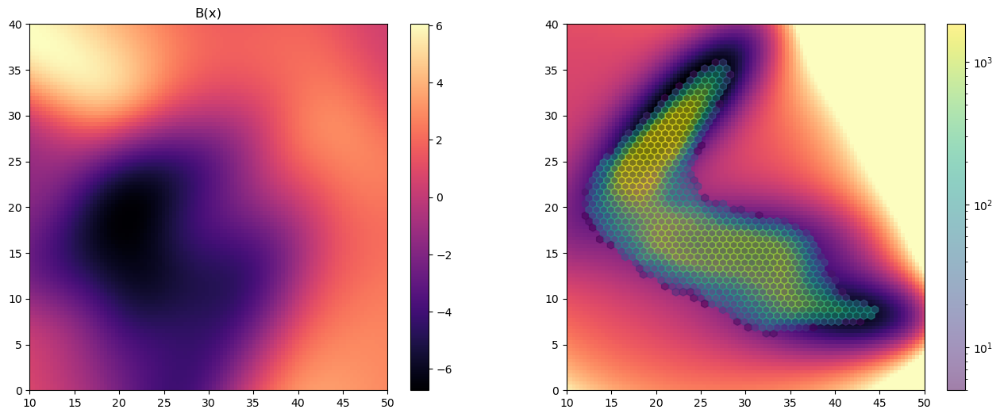

Iter:  9 l_f: 70285.6768 l_s: 5826.5616 lr:  3.3333333333333335e-05 success:  0.495


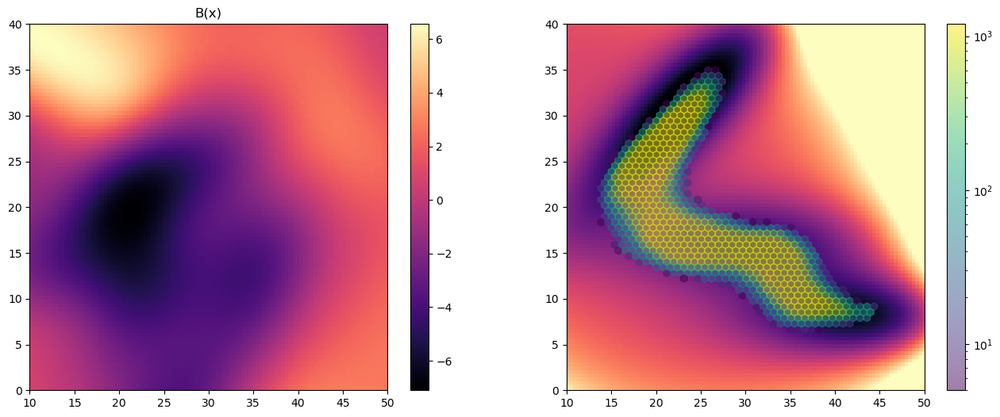

Iter:  10 l_f: 9729.168 l_s: 2814.173 lr:  3.3333333333333335e-05 success:  0.68333334


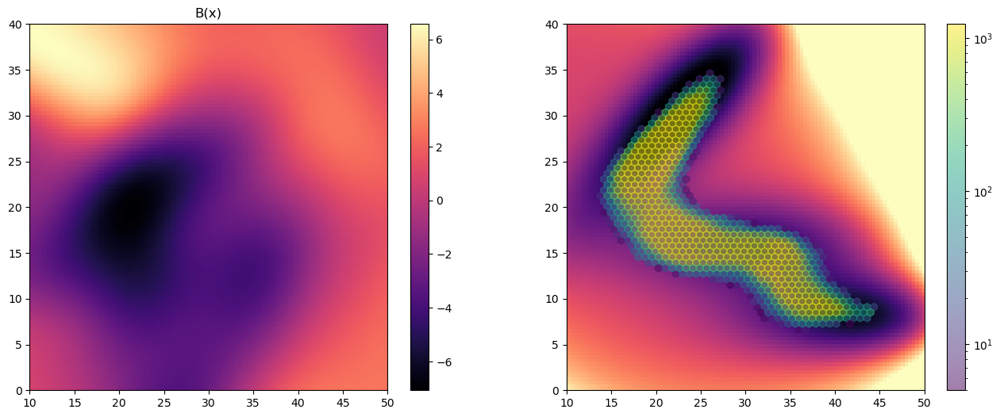

Iter:  11 l_f: 10113.8592 l_s: 4323.0884 lr:  1e-05 success:  0.725


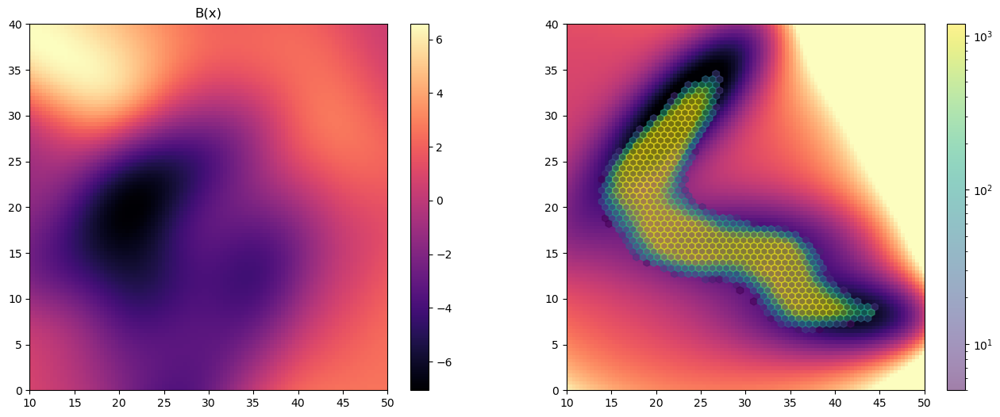

Iter:  12 l_f: 12288.3008 l_s: 3609.9996 lr:  3e-06 success:  0.69666666


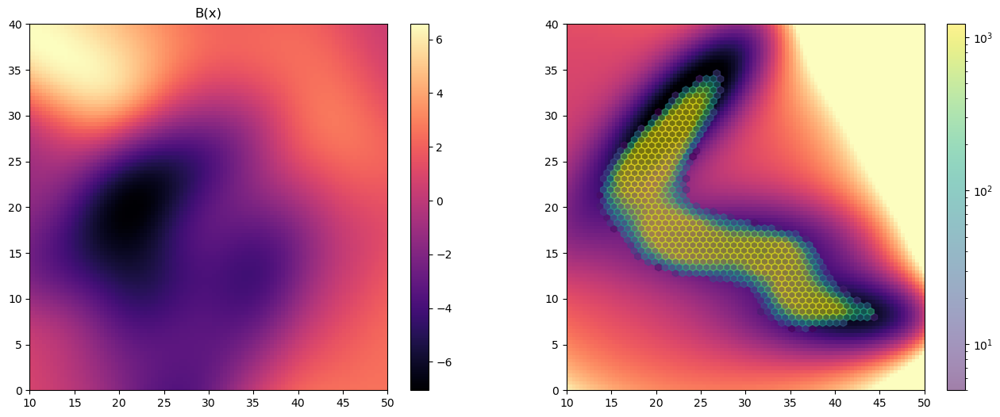

Iter:  13 l_f: 17334.9808 l_s: 3156.9168 lr:  3e-06 success:  0.71


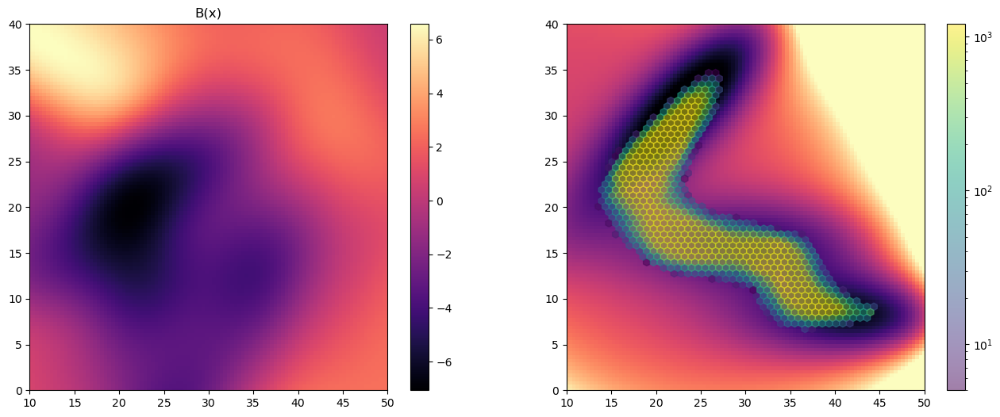

Iter:  14 l_f: 14917.96 l_s: 3225.825 lr:  3e-06 success:  0.7266667


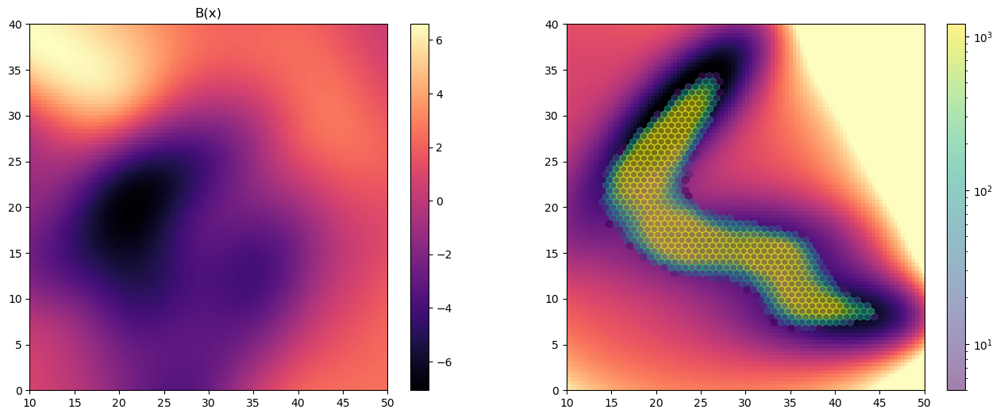

Iter:  15 l_f: 16573.9392 l_s: 5689.7604 lr:  3e-06 success:  0.75166667


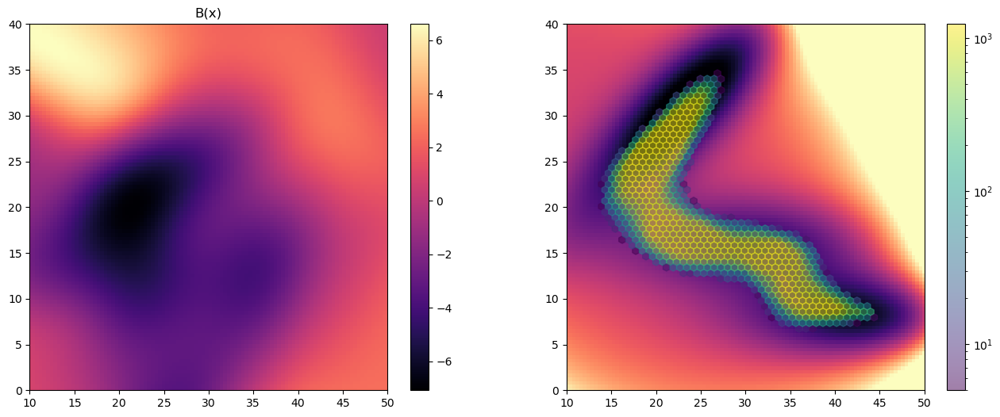

Iter:  16 l_f: 12900.2136 l_s: 4340.0284 lr:  3e-06 success:  0.755


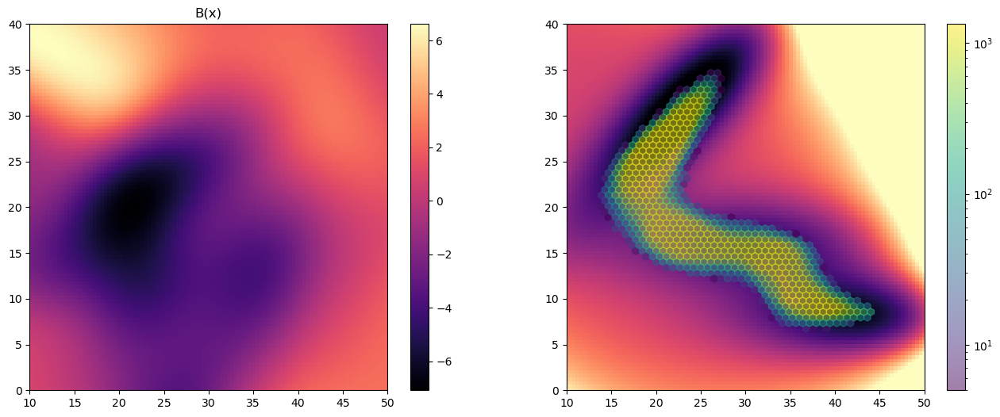

Iter:  17 l_f: 18471.5728 l_s: 4383.244 lr:  3e-06 success:  0.725


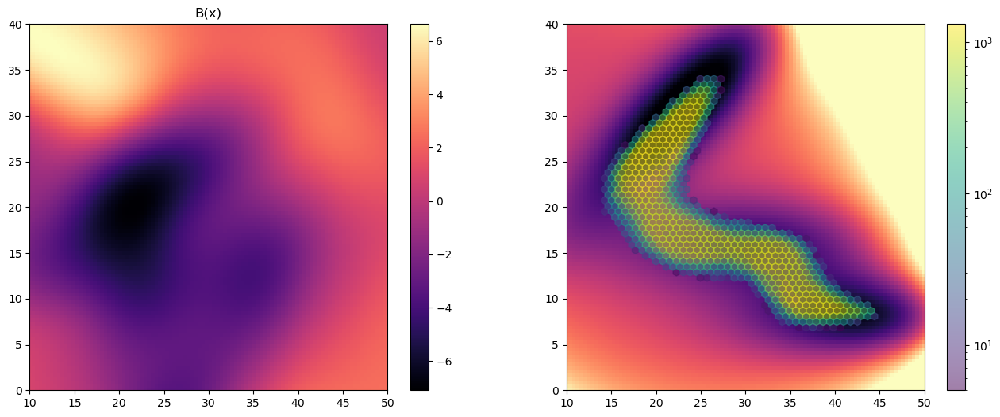

Iter:  18 l_f: 17989.4304 l_s: 4278.5384 lr:  3e-06 success:  0.75166667


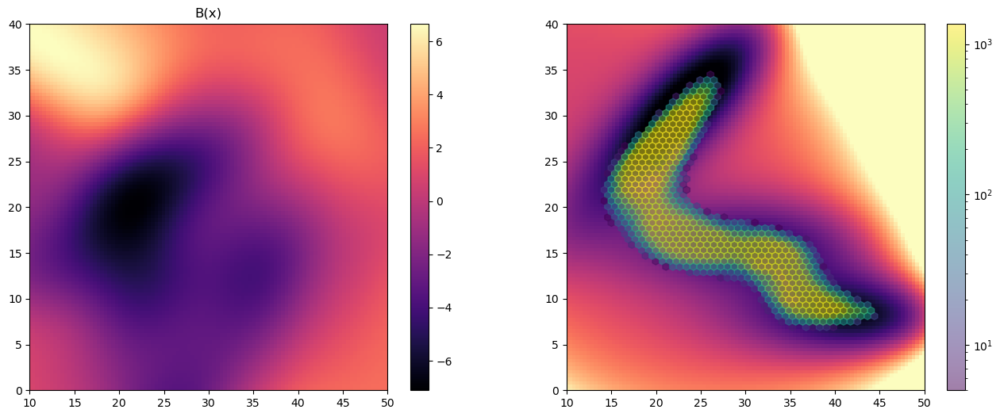

Iter:  19 l_f: 16540.3328 l_s: 3932.9384 lr:  3e-06 success:  0.75


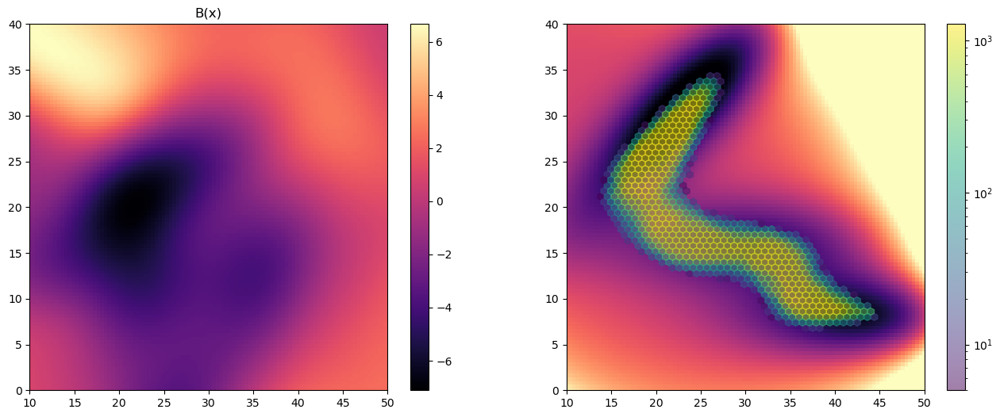

Iter:  20 l_f: 17977.7344 l_s: 3293.0458 lr:  3e-06 success:  0.75333333


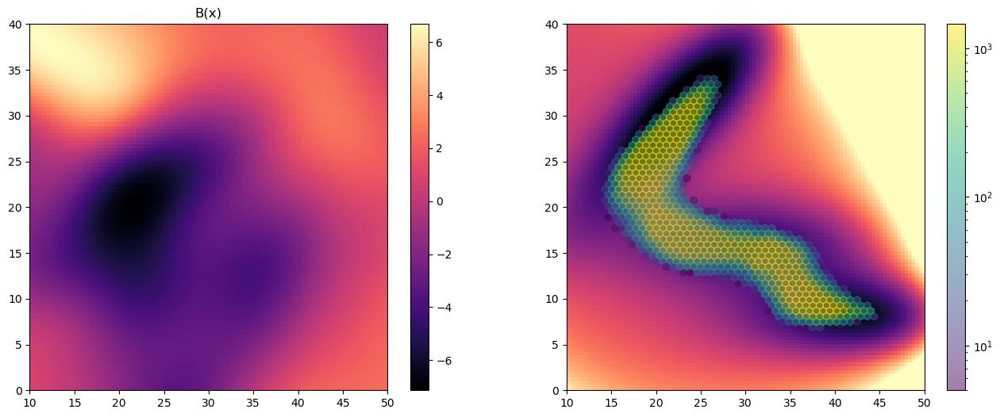

Iter:  21 l_f: 22469.3008 l_s: 3030.4234 lr:  3e-06 success:  0.72


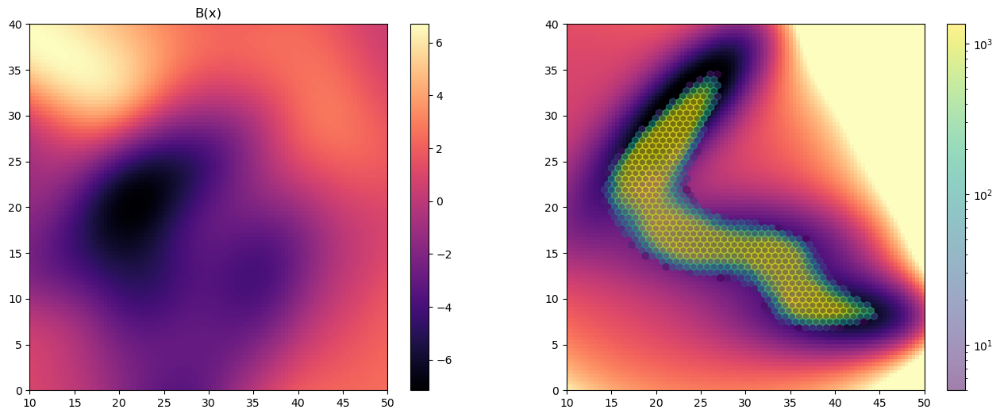

Iter:  22 l_f: 21878.6304 l_s: 3413.452 lr:  3e-06 success:  0.74


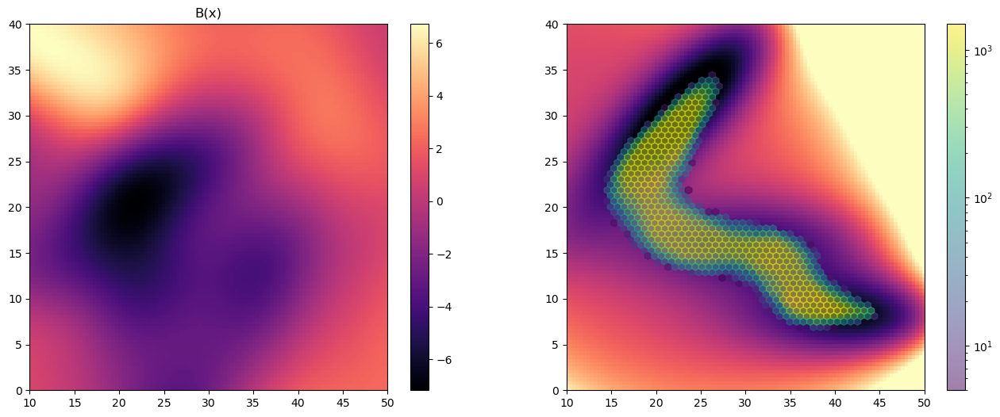

Iter:  23 l_f: 24436.9664 l_s: 3624.5556 lr:  3e-06 success:  0.72


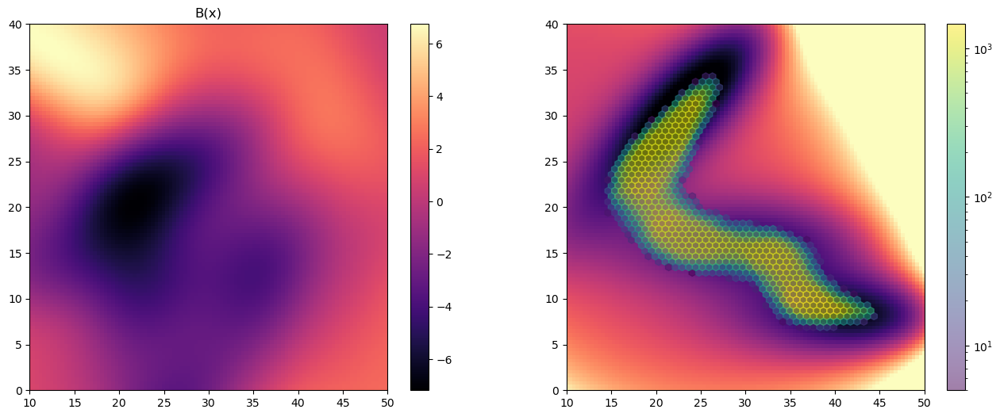

Iter:  24 l_f: 26019.3376 l_s: 4161.9736 lr:  3e-06 success:  0.72833335


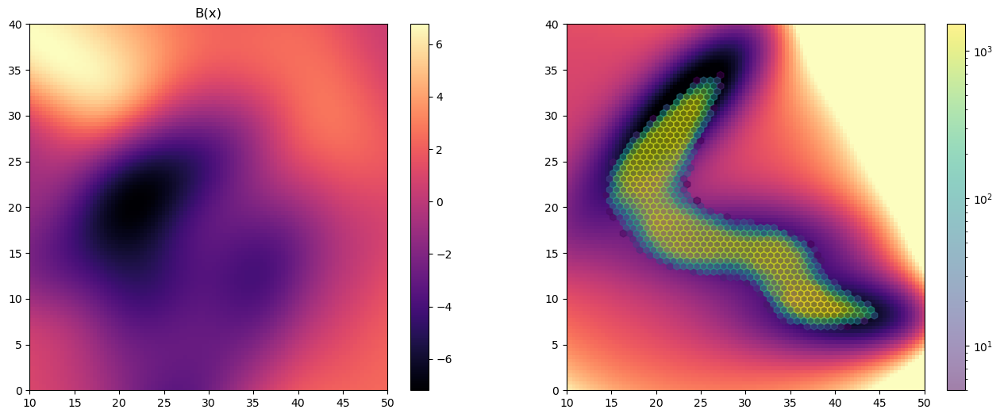

Iter:  25 l_f: 24628.4656 l_s: 3379.9392 lr:  3e-06 success:  0.725


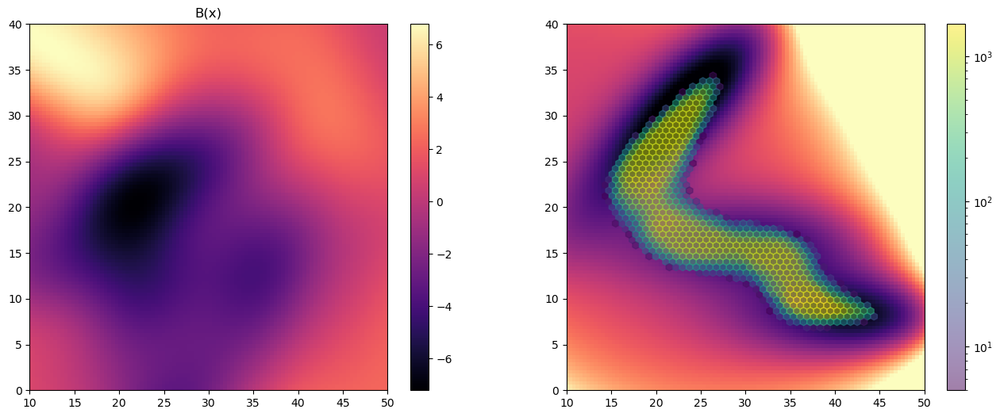

Iter:  26 l_f: 30321.1808 l_s: 3985.5988 lr:  3e-06 success:  0.72


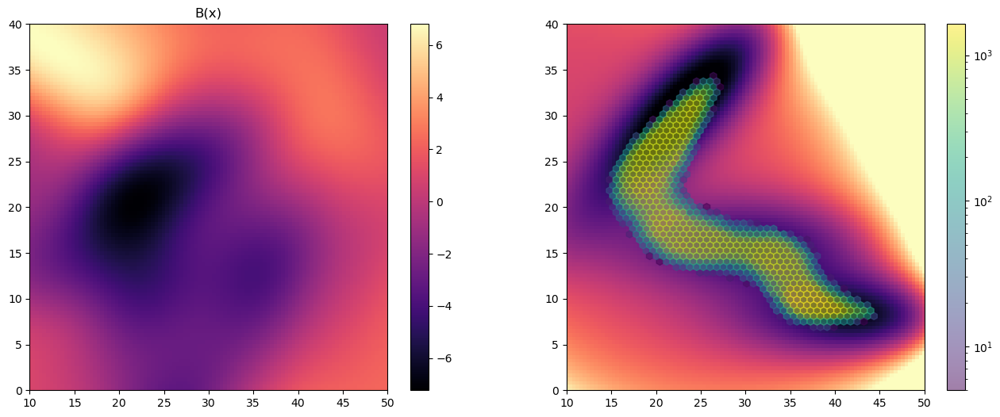

Iter:  27 l_f: 29046.608 l_s: 3270.9002 lr:  3e-06 success:  0.7216667


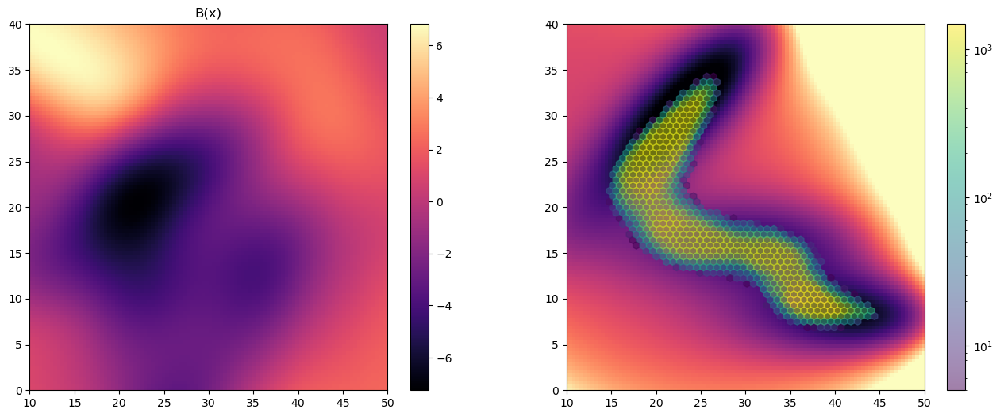

Iter:  28 l_f: 28114.32 l_s: 4865.2372 lr:  3e-06 success:  0.7216667


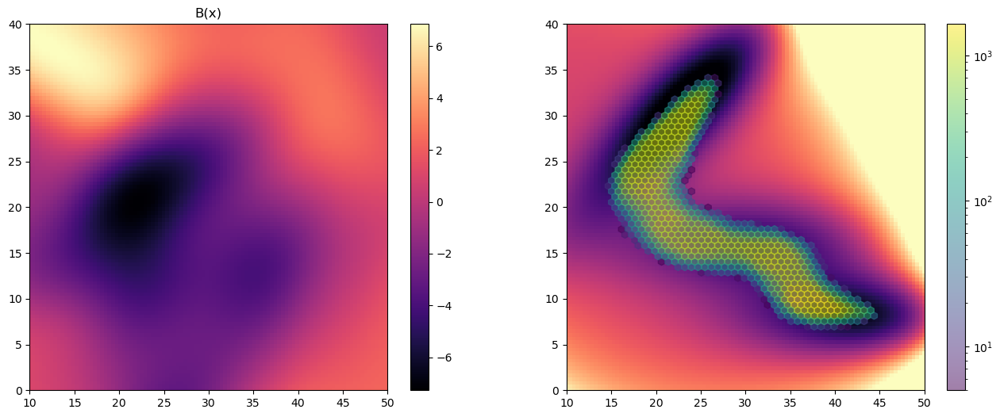

Iter:  29 l_f: 23928.9616 l_s: 2959.2246 lr:  3e-06 success:  0.74333334


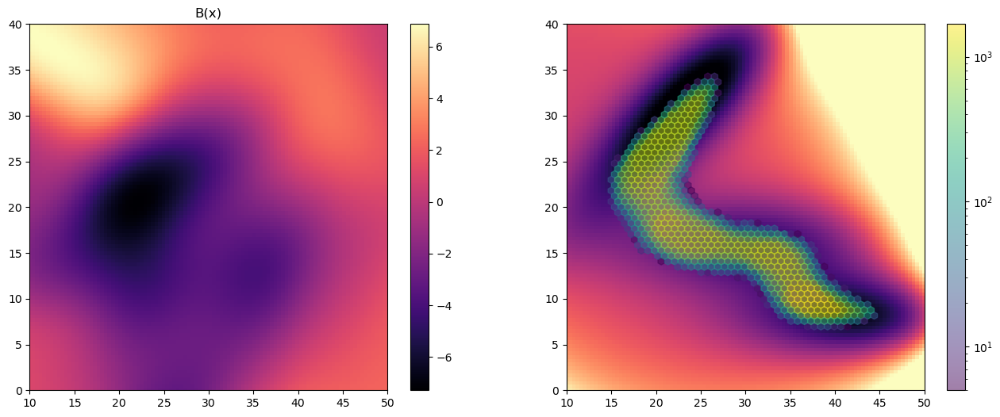

Iter:  30 l_f: 29762.2432 l_s: 3599.7028 lr:  3e-06 success:  0.70666665


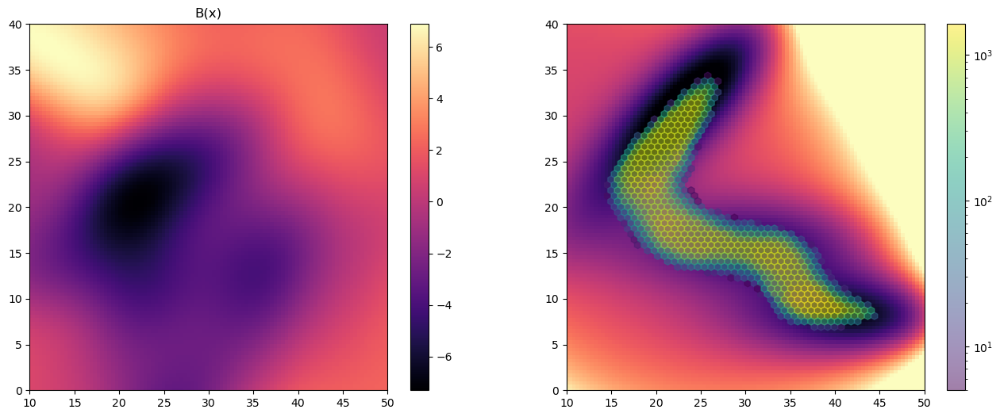

Iter:  31 l_f: 23438.4992 l_s: 2998.96 lr:  3e-06 success:  0.71666664


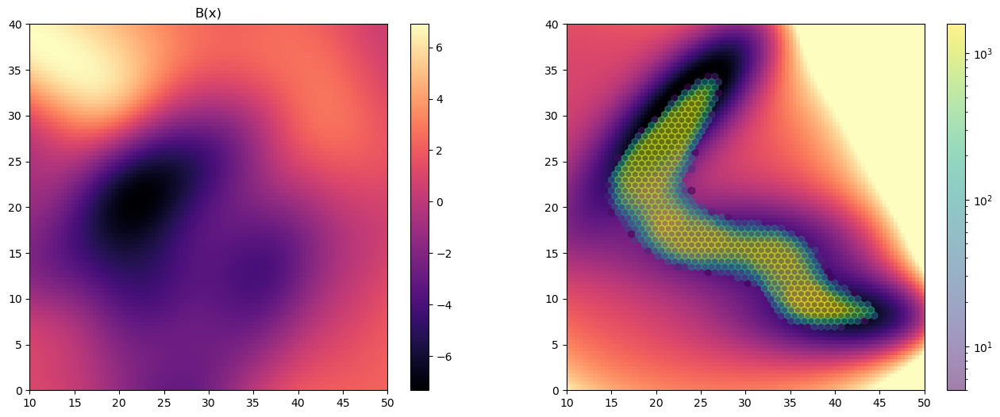

Iter:  32 l_f: 26491.0192 l_s: 2868.6204 lr:  3e-06 success:  0.7033333


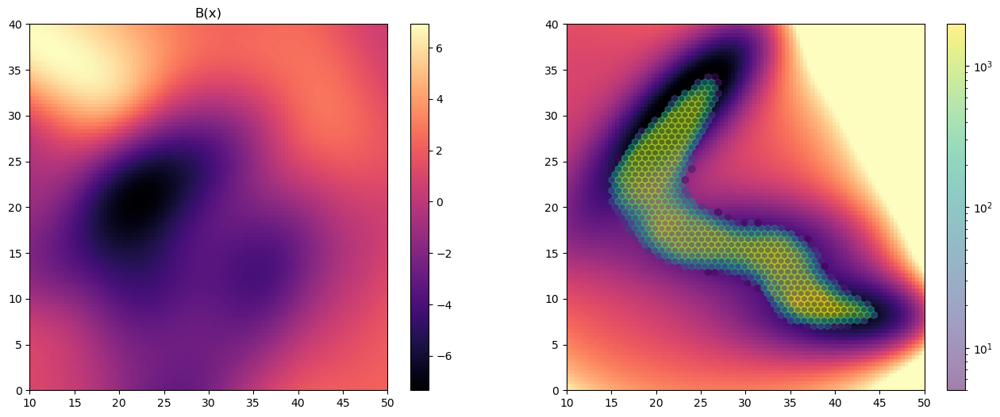

Iter:  33 l_f: 29794.6496 l_s: 2975.2202 lr:  3e-06 success:  0.7083333


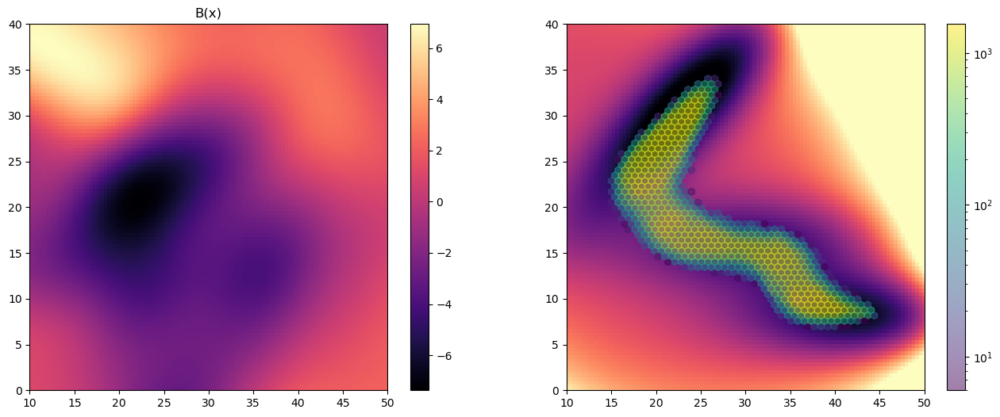

Iter:  34 l_f: 29657.7632 l_s: 3460.1612 lr:  3e-06 success:  0.69666666


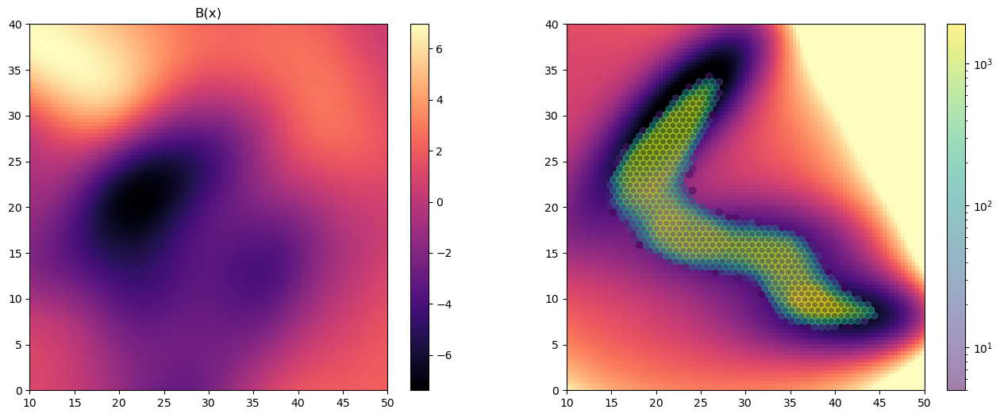

Iter:  35 l_f: 34015.824 l_s: 2647.803 lr:  3e-06 success:  0.7033333


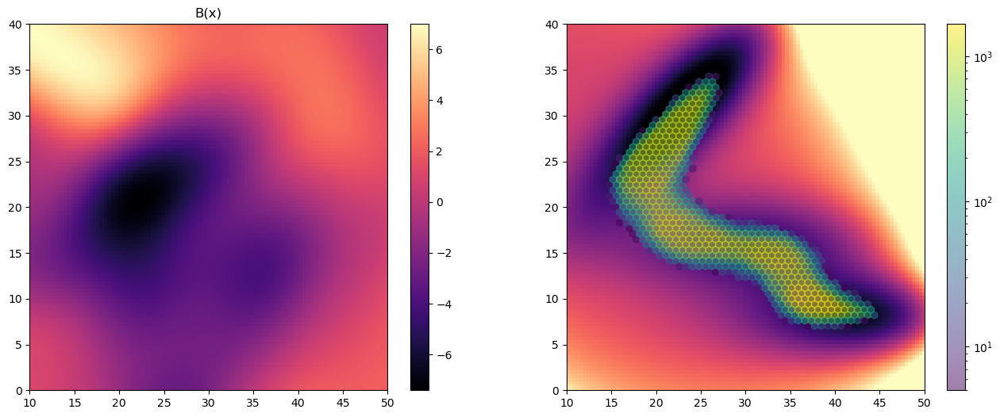

Iter:  36 l_f: 26409.664 l_s: 2815.9376 lr:  3e-06 success:  0.725


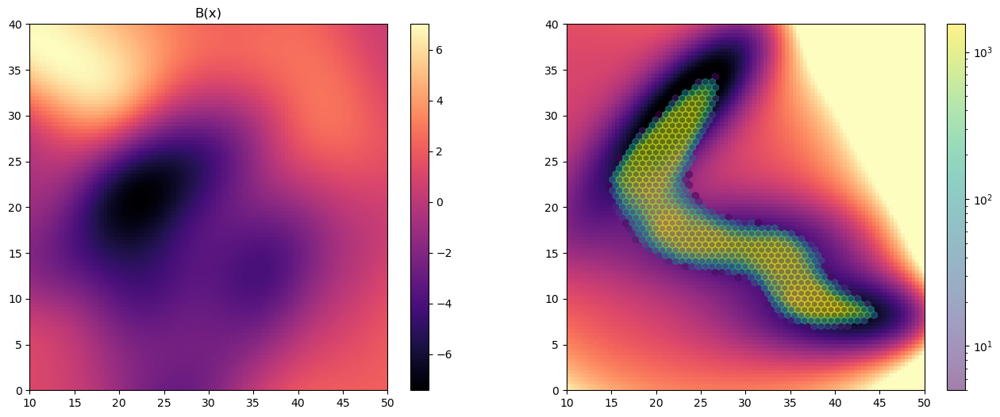

Iter:  37 l_f: 23146.352 l_s: 2600.1638 lr:  3e-06 success:  0.74666667


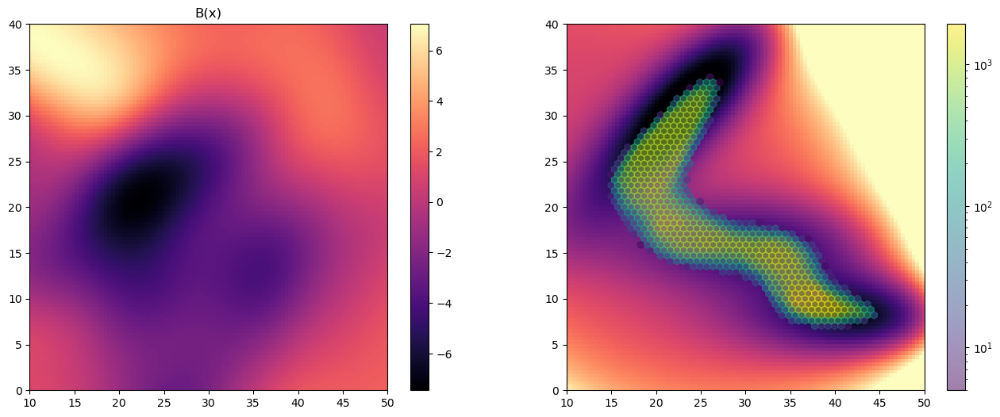

Iter:  38 l_f: 26274.92 l_s: 3210.6906 lr:  3e-06 success:  0.74666667


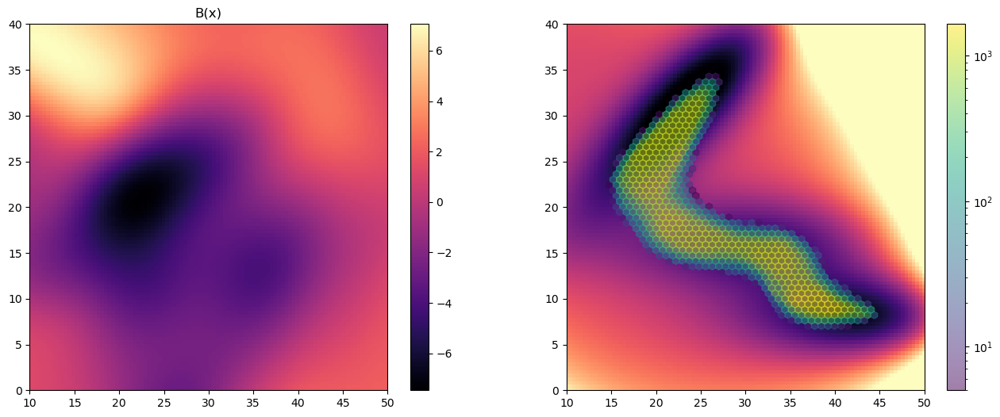

Iter:  39 l_f: 21559.776 l_s: 2323.6154 lr:  3e-06 success:  0.72


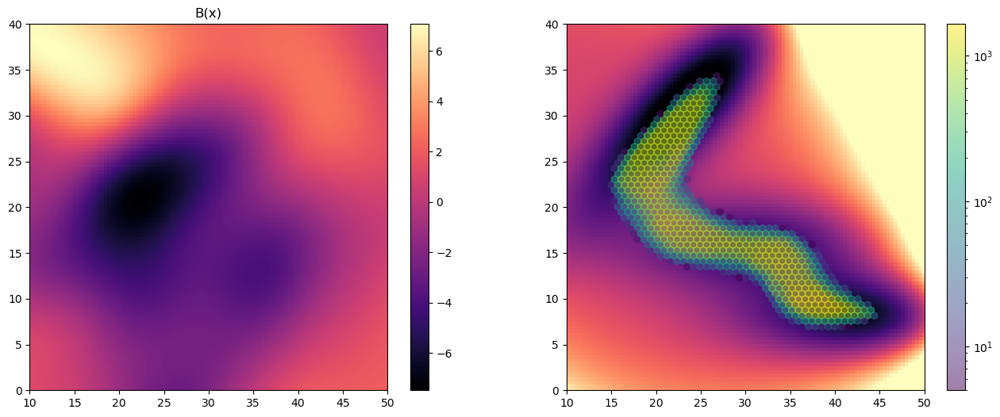

Iter:  40 l_f: 28549.6256 l_s: 2407.9538 lr:  3e-06 success:  0.75


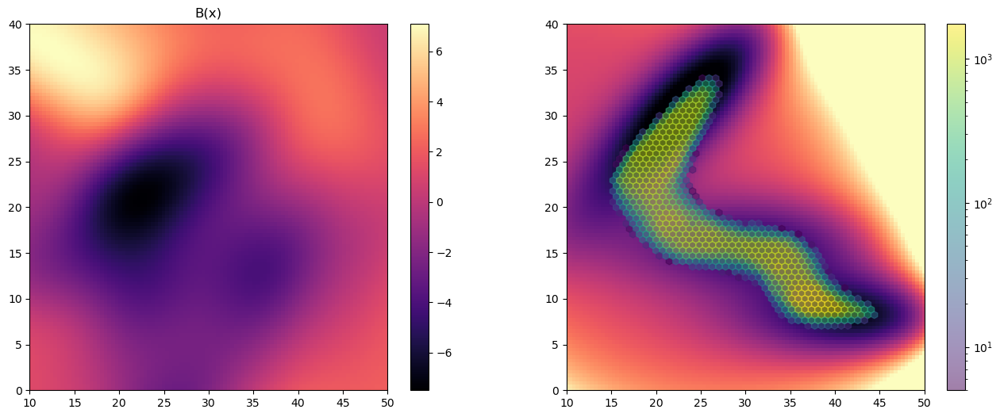

Iter:  41 l_f: 29749.5392 l_s: 1769.8956 lr:  3e-06 success:  0.72833335


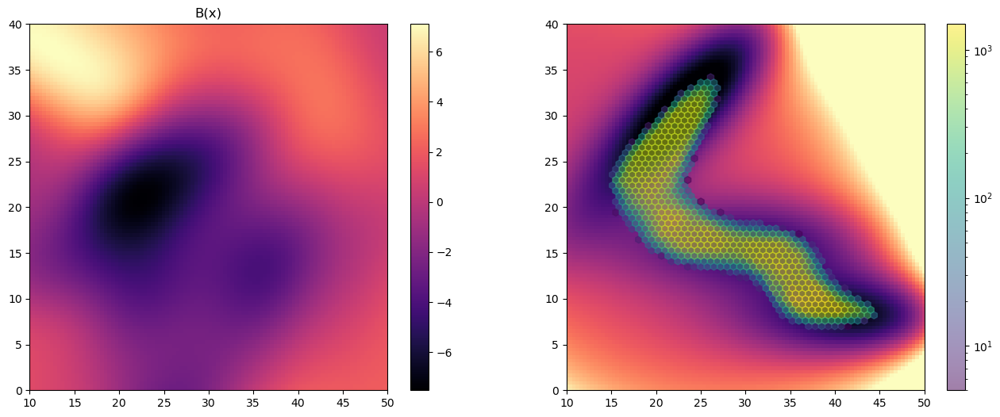

Iter:  42 l_f: 23965.672 l_s: 2821.1958 lr:  3e-06 success:  0.73333335


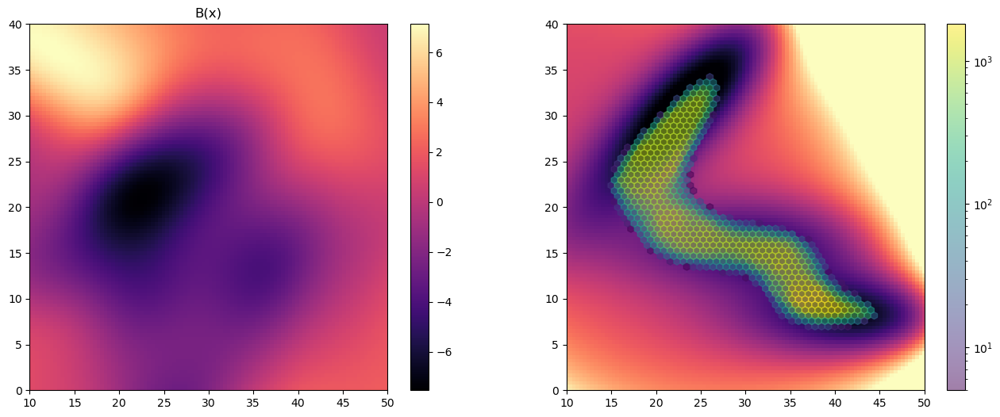

Iter:  43 l_f: 28078.0544 l_s: 2792.5798 lr:  3e-06 success:  0.74


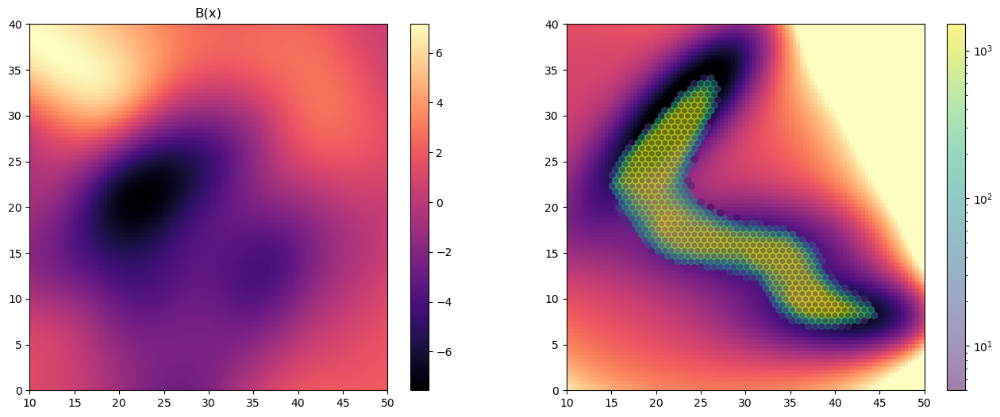

Iter:  44 l_f: 25861.064 l_s: 2837.6292 lr:  3e-06 success:  0.74


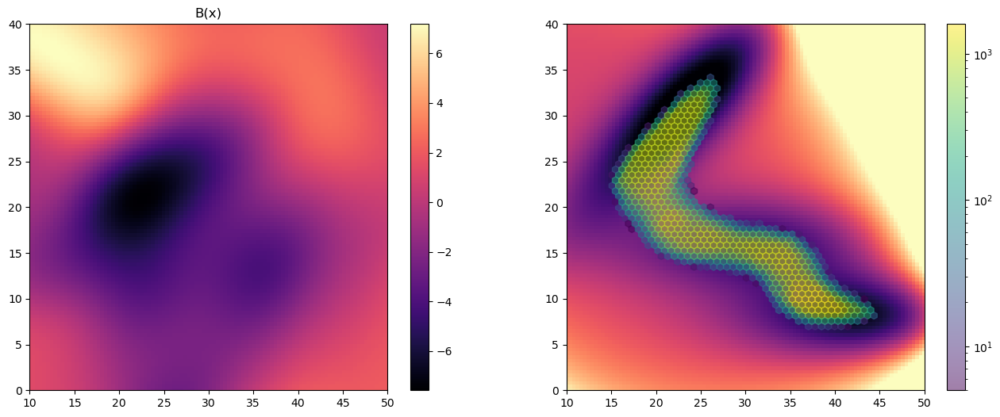

Iter:  45 l_f: 26750.36 l_s: 2943.4778 lr:  3e-06 success:  0.72833335


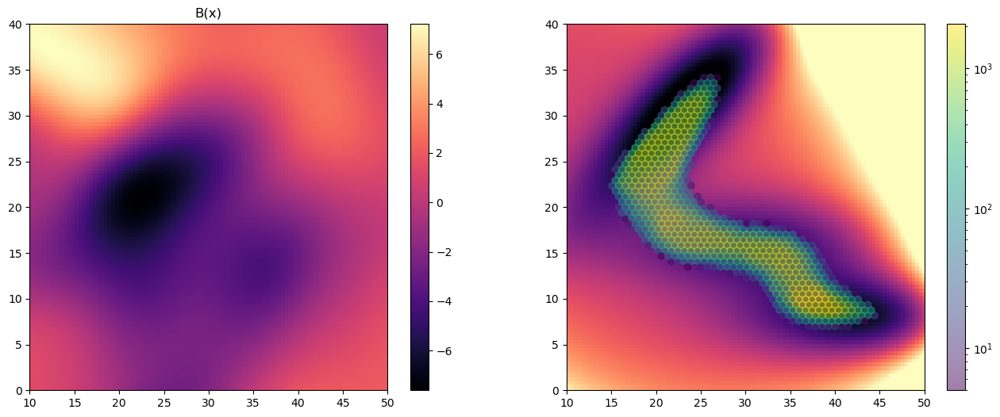

Iter:  46 l_f: 27530.2432 l_s: 2847.5488 lr:  3e-06 success:  0.7366667


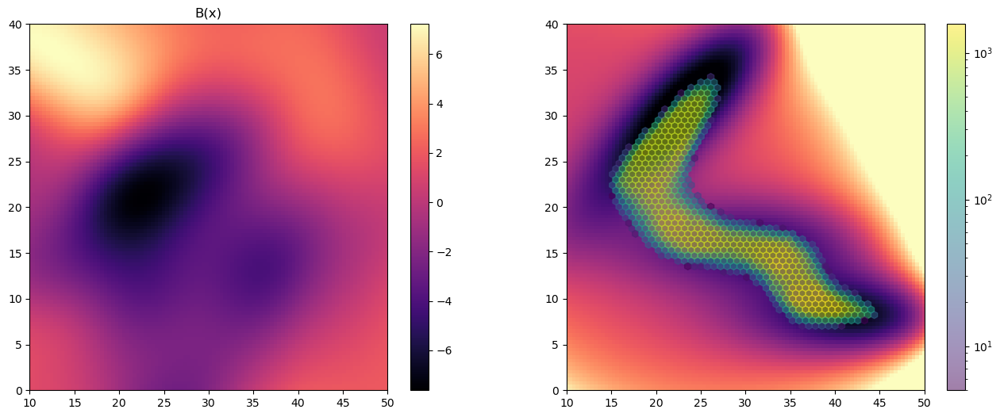

Iter:  47 l_f: 18963.5584 l_s: 1880.0148 lr:  3e-06 success:  0.7633333


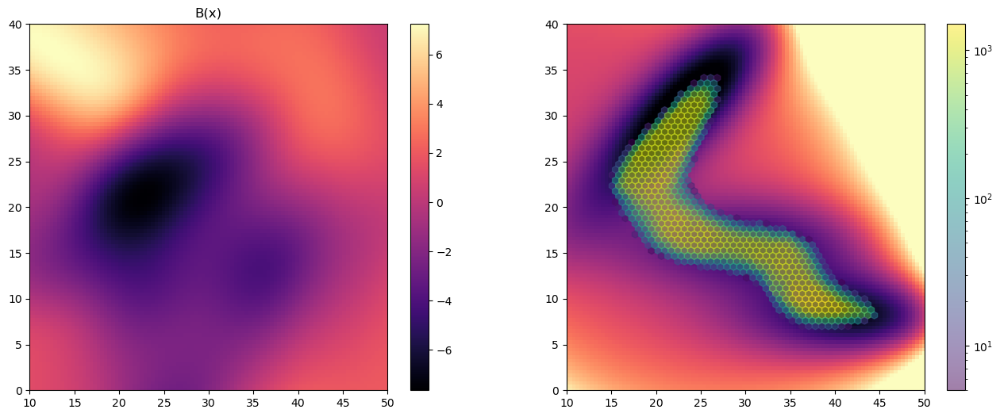

Iter:  48 l_f: 25099.152 l_s: 2382.615 lr:  3e-06 success:  0.77666664


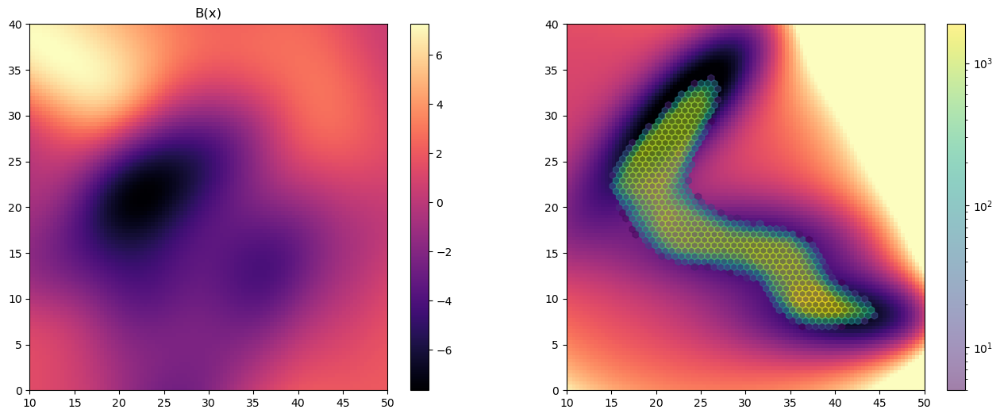

Iter:  49 l_f: 19830.1712 l_s: 2517.5108 lr:  3e-06 success:  0.7916667


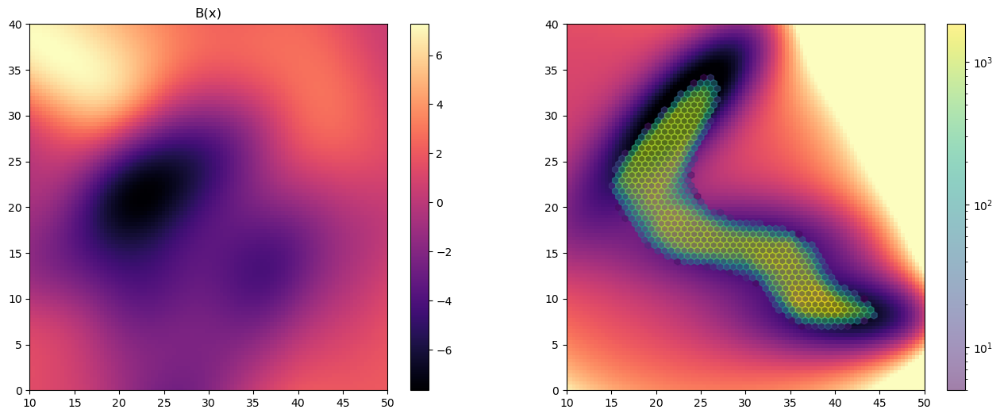

Iter:  50 l_f: 25331.816 l_s: 3091.7566 lr:  3e-06 success:  0.75166667


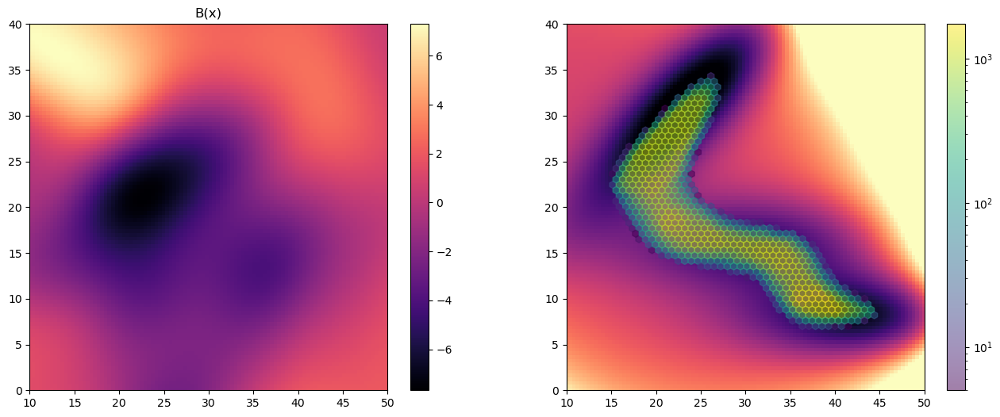

Iter:  51 l_f: 22465.4672 l_s: 2477.5268 lr:  3e-06 success:  0.7583333


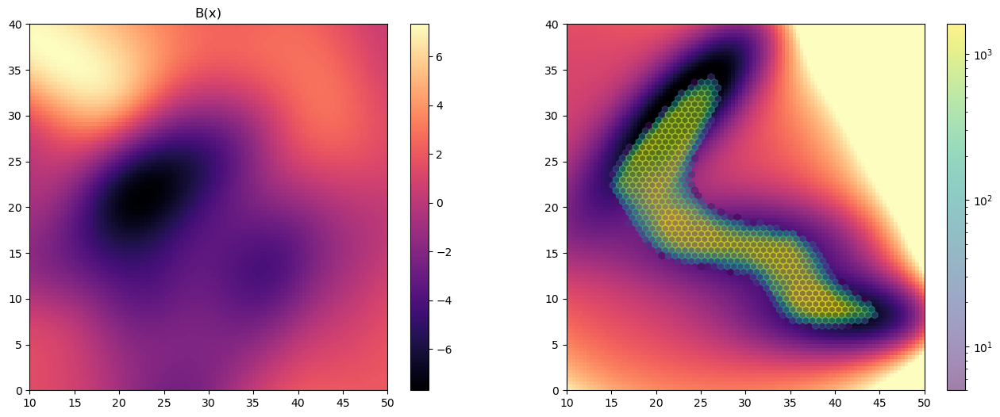

Iter:  52 l_f: 23666.4048 l_s: 2652.0508 lr:  3e-06 success:  0.75333333


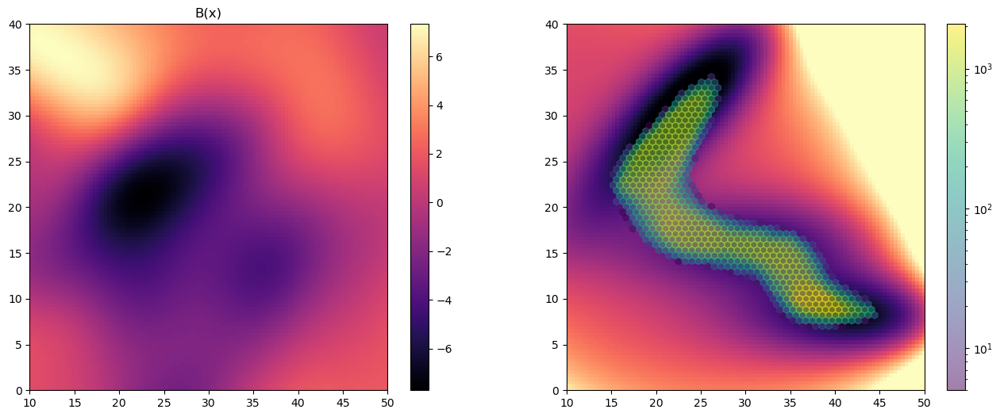

Iter:  53 l_f: 27319.2864 l_s: 2794.0566 lr:  3e-06 success:  0.7733333


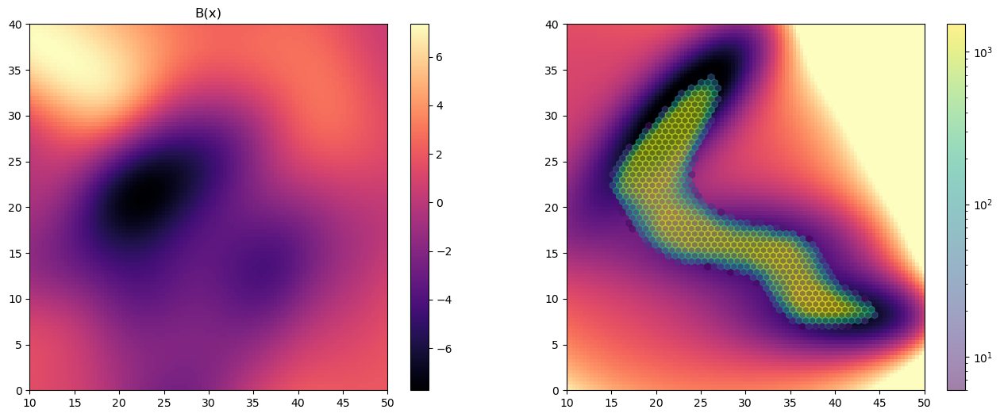

Iter:  54 l_f: 19842.5296 l_s: 2260.799 lr:  3e-06 success:  0.79


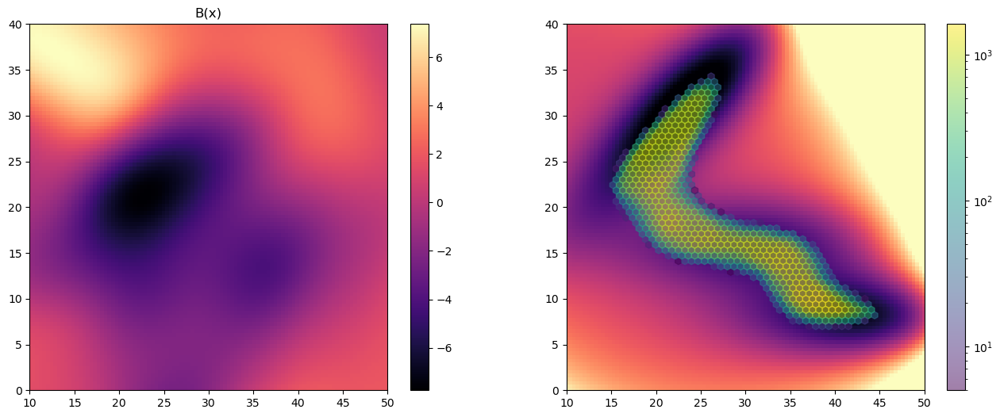

Iter:  55 l_f: 16361.9776 l_s: 3198.0502 lr:  3e-06 success:  0.7916667


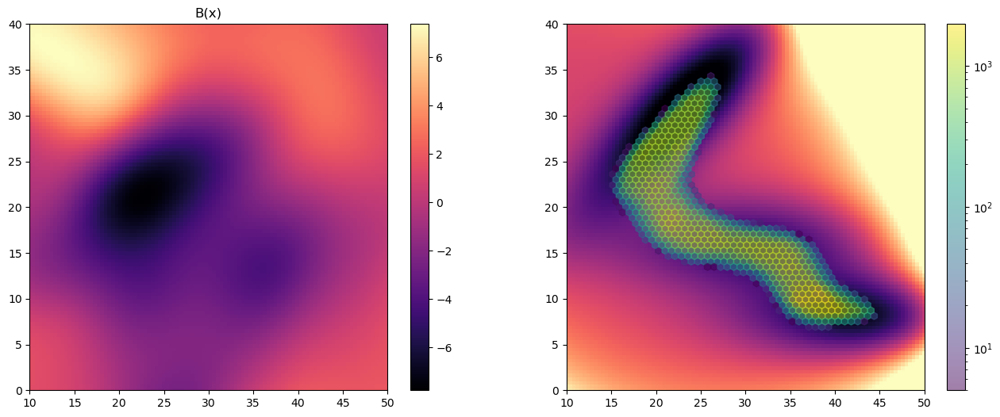

Iter:  56 l_f: 22461.16 l_s: 2814.2964 lr:  3e-06 success:  0.7866667


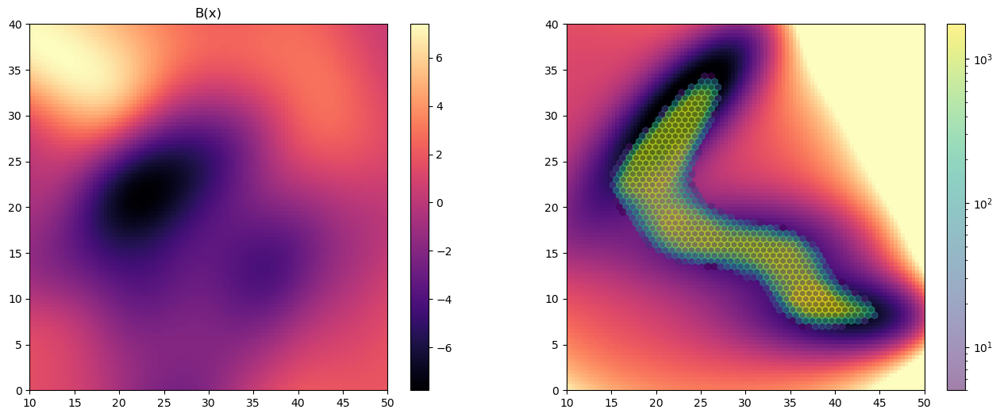

Iter:  57 l_f: 23391.0672 l_s: 2846.8206 lr:  3e-06 success:  0.765


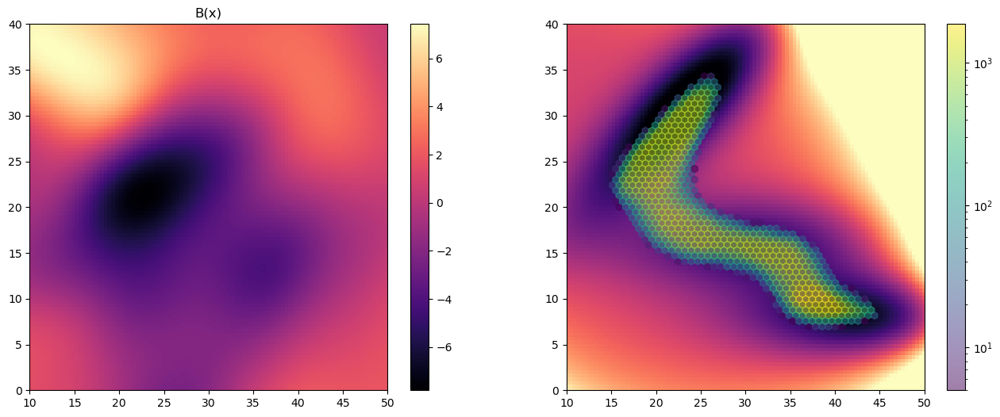

Iter:  58 l_f: 29603.5072 l_s: 2674.8834 lr:  3e-06 success:  0.77166665


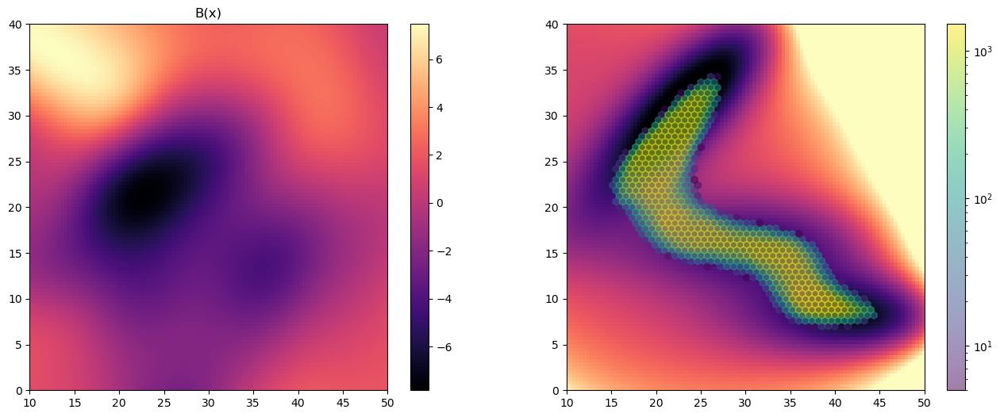

Iter:  59 l_f: 22198.9104 l_s: 3123.2216 lr:  3e-06 success:  0.775


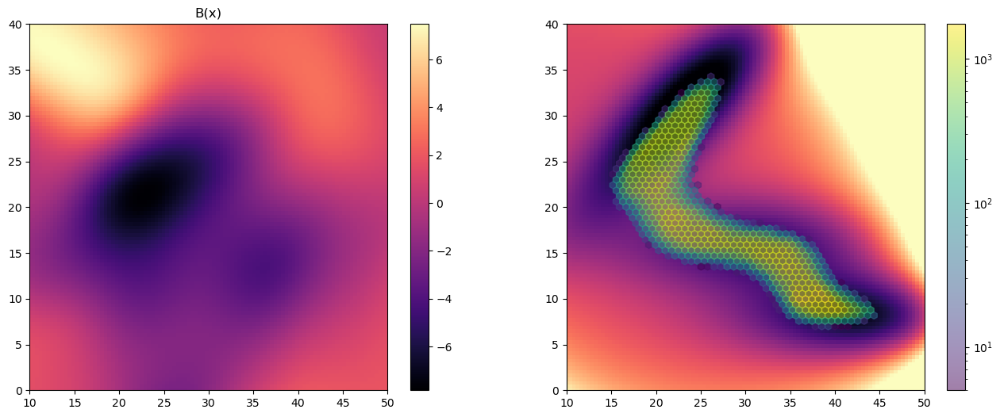

Iter:  60 l_f: 19012.736 l_s: 3430.8272 lr:  3e-06 success:  0.78


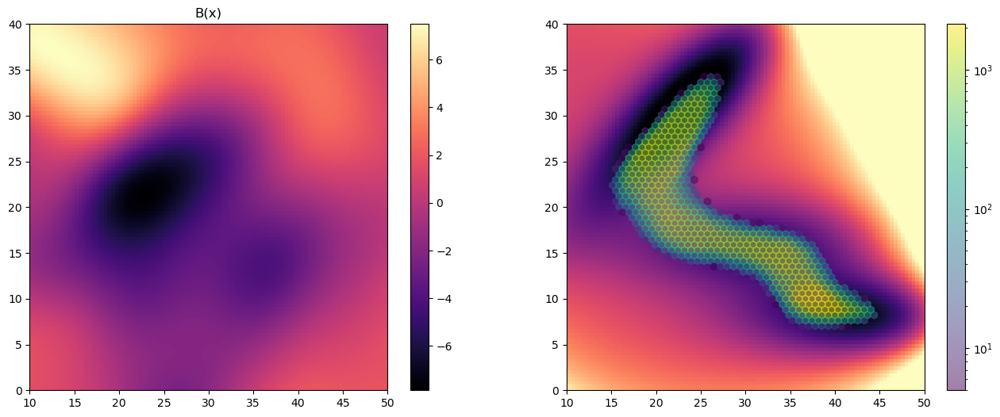

Iter:  61 l_f: 24223.4256 l_s: 2888.967 lr:  3e-06 success:  0.785


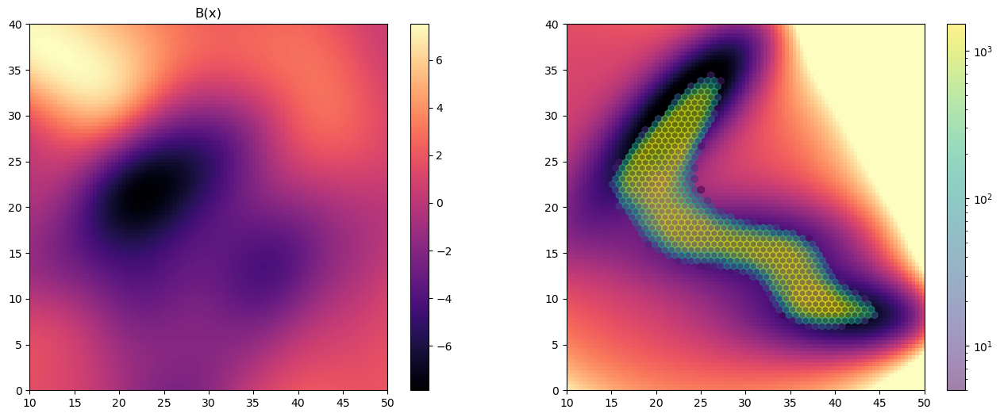

Iter:  62 l_f: 14457.0544 l_s: 3841.048 lr:  3e-06 success:  0.80833334


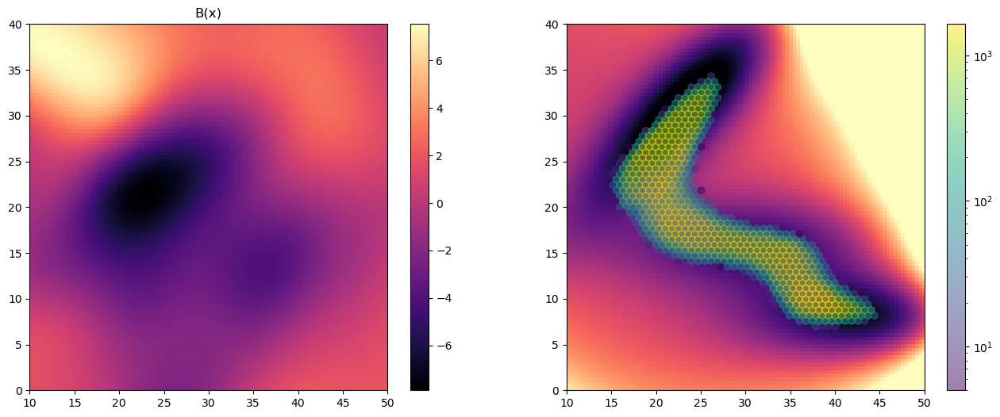

Iter:  63 l_f: 19956.3952 l_s: 3386.9488 lr:  3e-06 success:  0.8016667


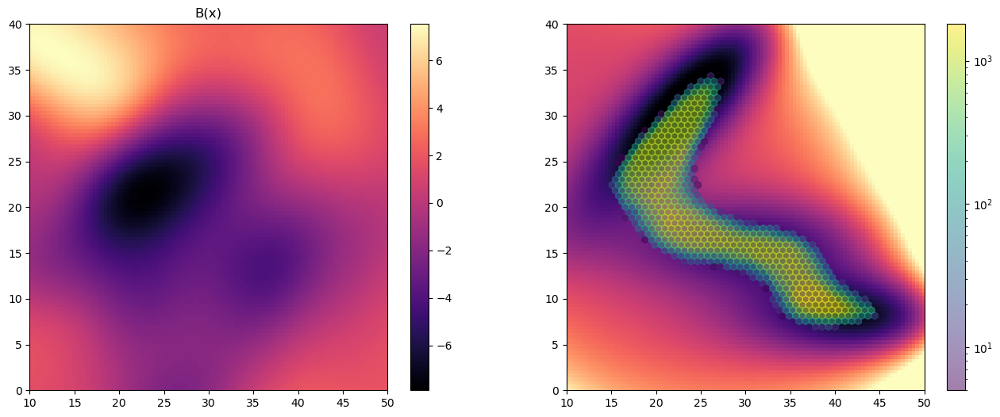

Iter:  64 l_f: 20935.1328 l_s: 2263.858 lr:  3e-06 success:  0.79333335


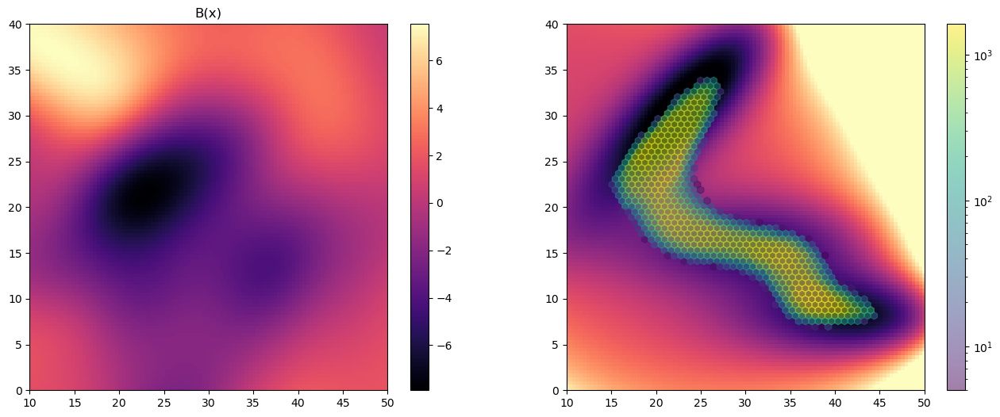

Iter:  65 l_f: 17512.0416 l_s: 3114.496 lr:  3e-06 success:  0.7966667


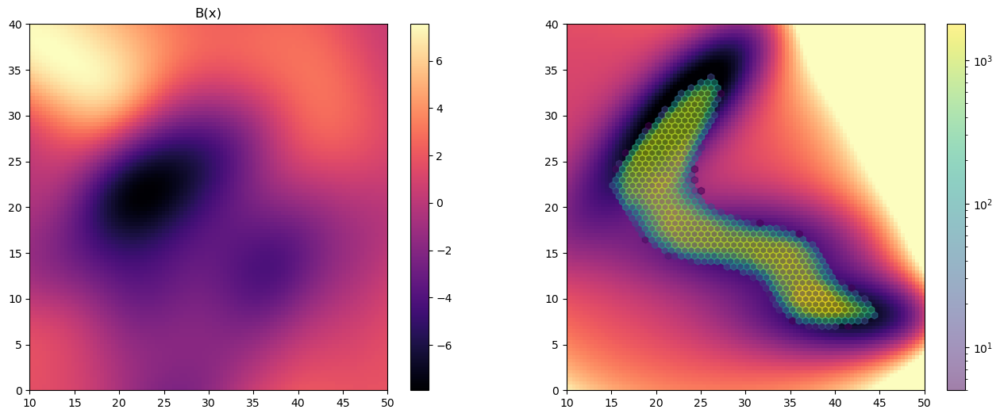

Iter:  66 l_f: 22625.936 l_s: 2708.4974 lr:  3e-06 success:  0.7966667


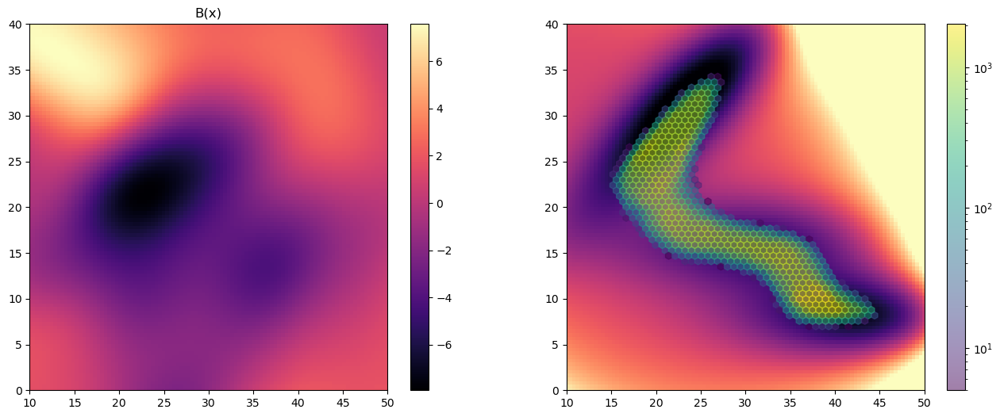

Iter:  67 l_f: 21505.7168 l_s: 3698.5348 lr:  3e-06 success:  0.765


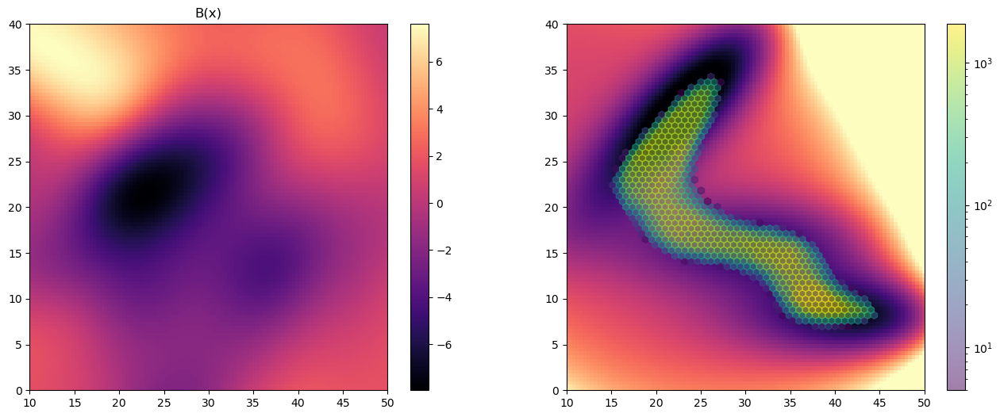

Iter:  68 l_f: 26978.992 l_s: 3454.0924 lr:  3e-06 success:  0.7783333


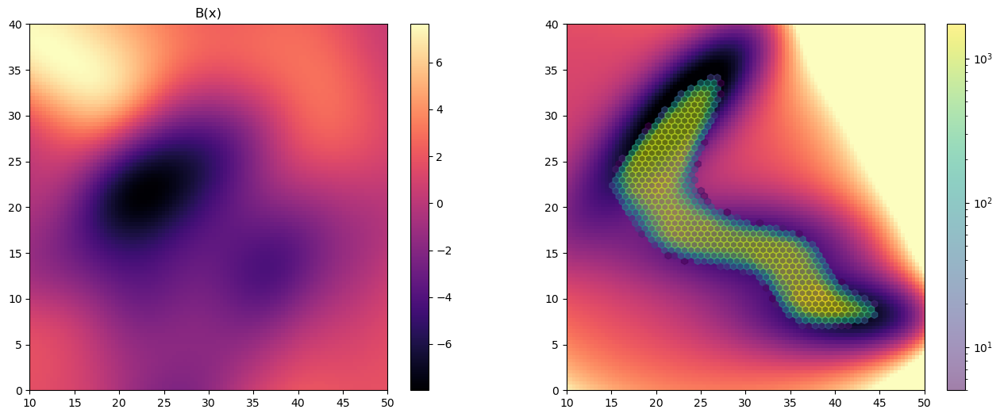

Iter:  69 l_f: 17393.2576 l_s: 3788.456 lr:  3e-06 success:  0.82666665


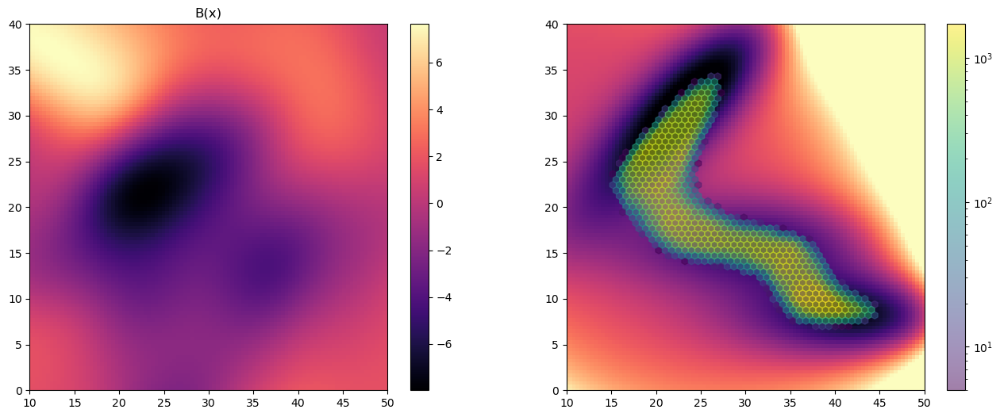

Iter:  70 l_f: 19681.1504 l_s: 3586.8252 lr:  3e-06 success:  0.82666665


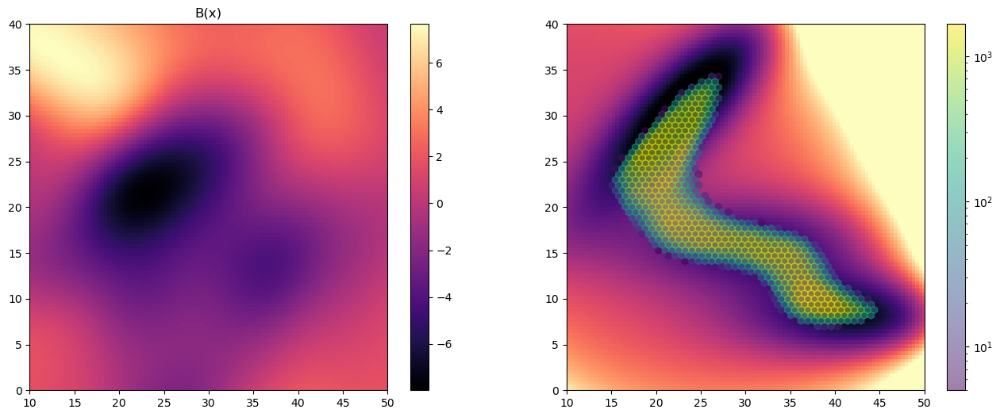

Iter:  71 l_f: 16844.1136 l_s: 4845.2568 lr:  3e-06 success:  0.8183333


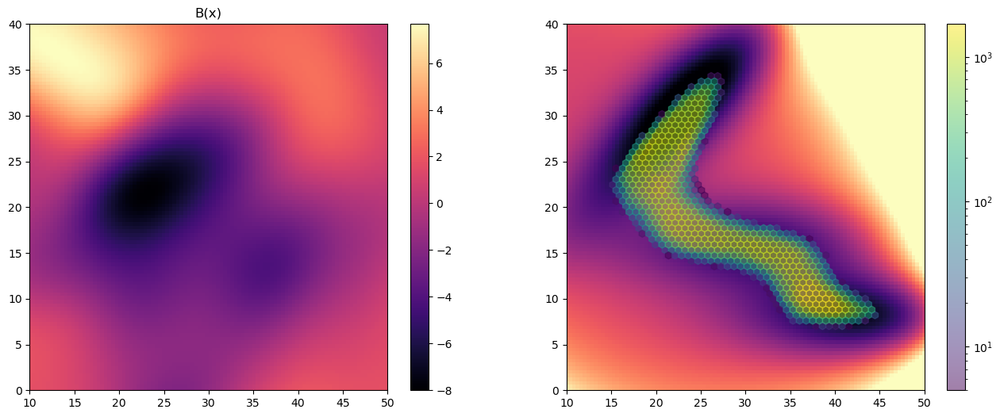

Iter:  72 l_f: 15255.9712 l_s: 3715.6496 lr:  3e-06 success:  0.83666664


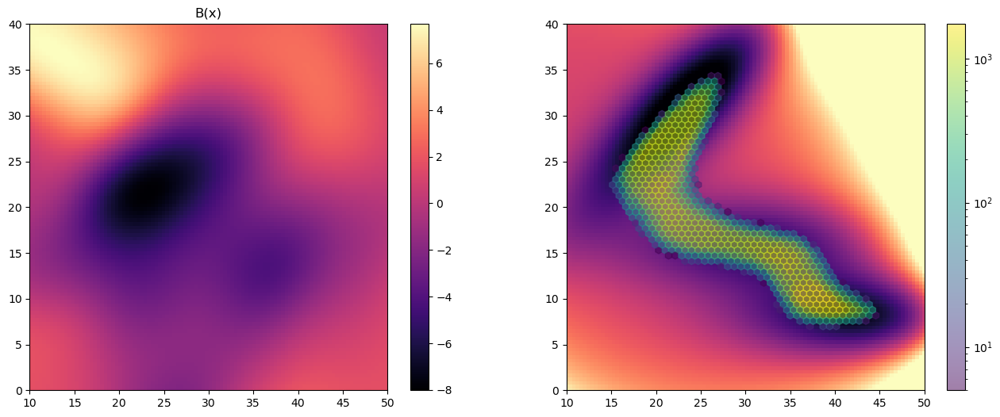

Iter:  73 l_f: 20210.84 l_s: 2494.2292 lr:  3e-06 success:  0.83166665


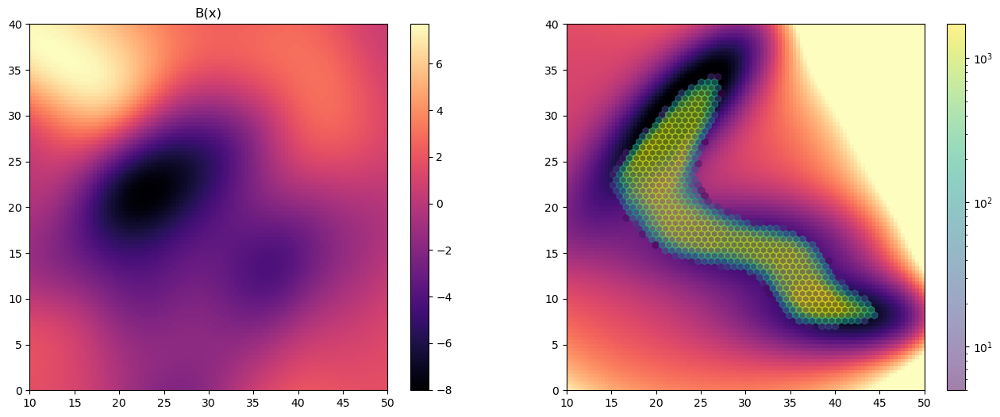

Iter:  74 l_f: 13618.296 l_s: 4366.5712 lr:  3e-06 success:  0.83666664


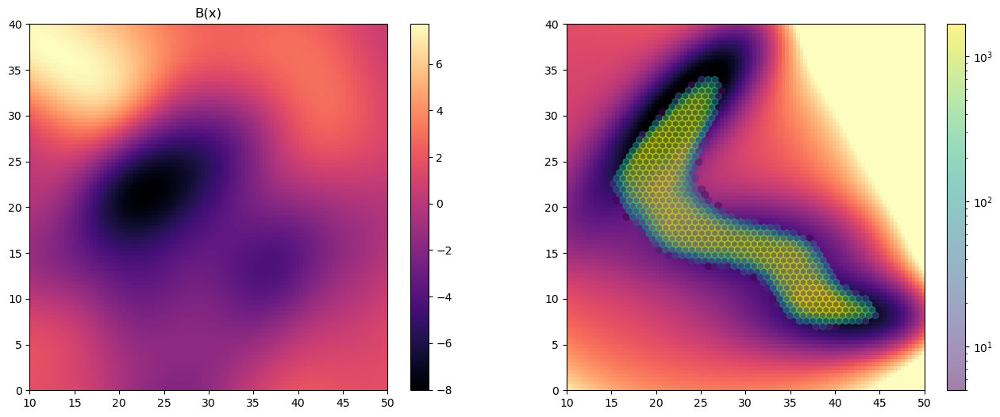

Iter:  75 l_f: 17252.3776 l_s: 4232.6388 lr:  3e-06 success:  0.825


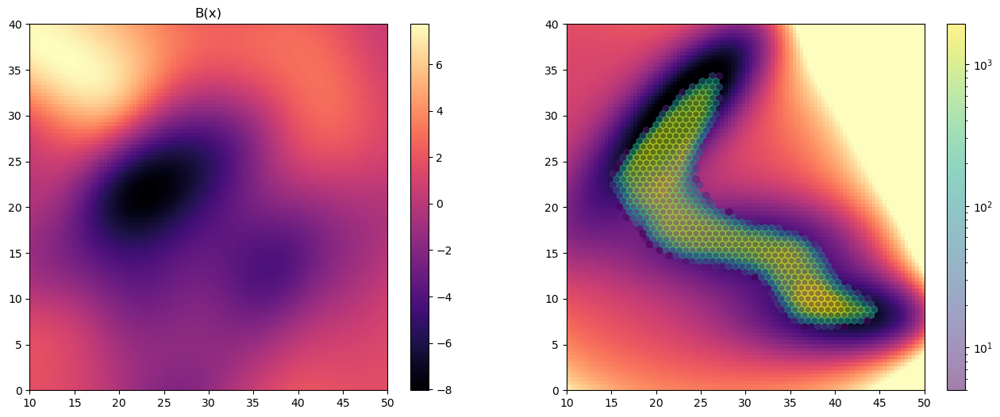

Iter:  76 l_f: 25004.0384 l_s: 3501.1944 lr:  3e-06 success:  0.8


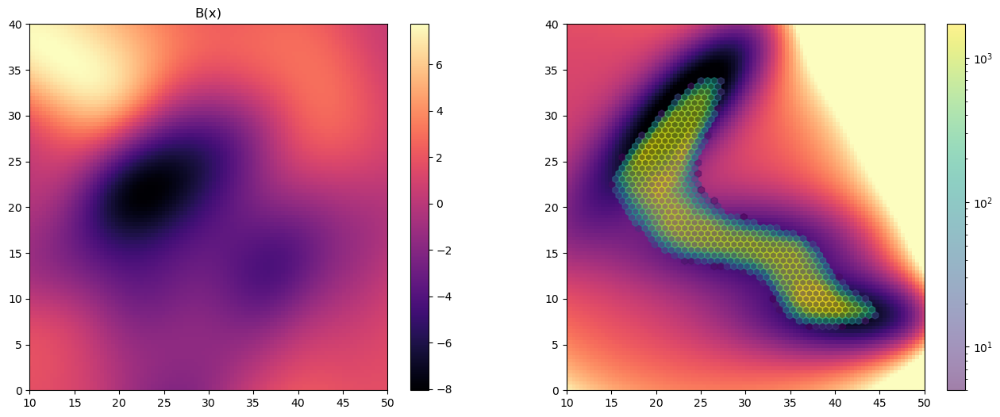

Iter:  77 l_f: 19099.8528 l_s: 4535.2184 lr:  3e-06 success:  0.83


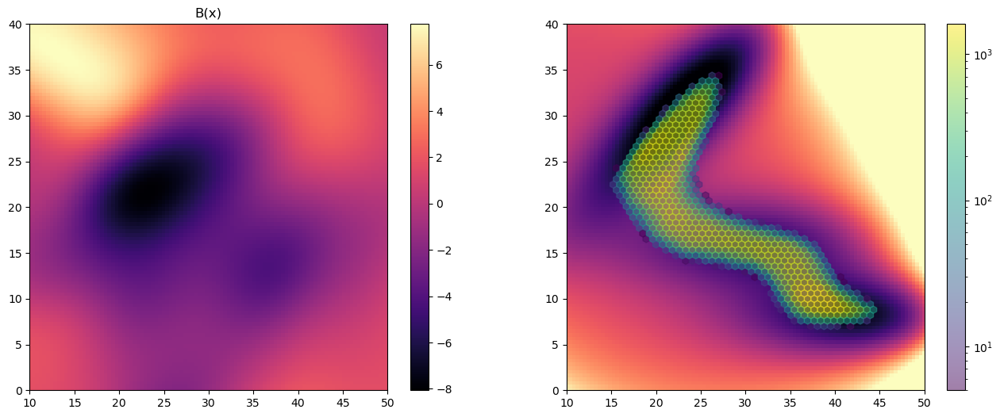

Iter:  78 l_f: 15819.0608 l_s: 3904.0104 lr:  3e-06 success:  0.8383333


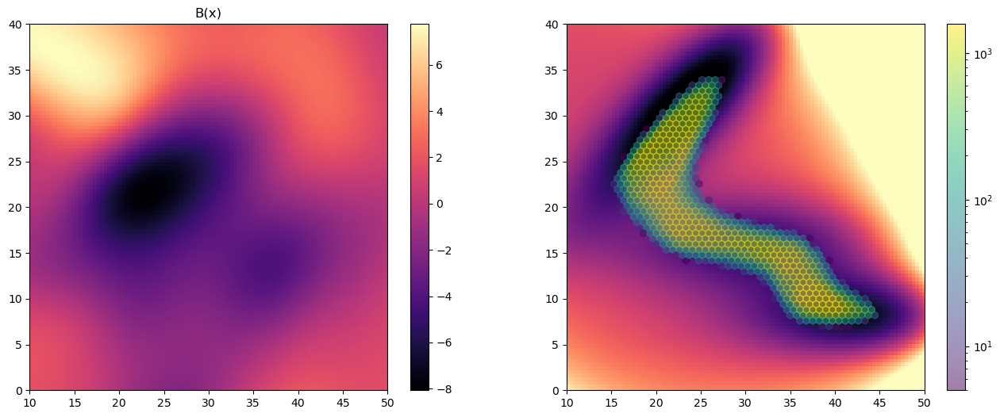

Iter:  79 l_f: 18013.8384 l_s: 3890.8724 lr:  3e-06 success:  0.81


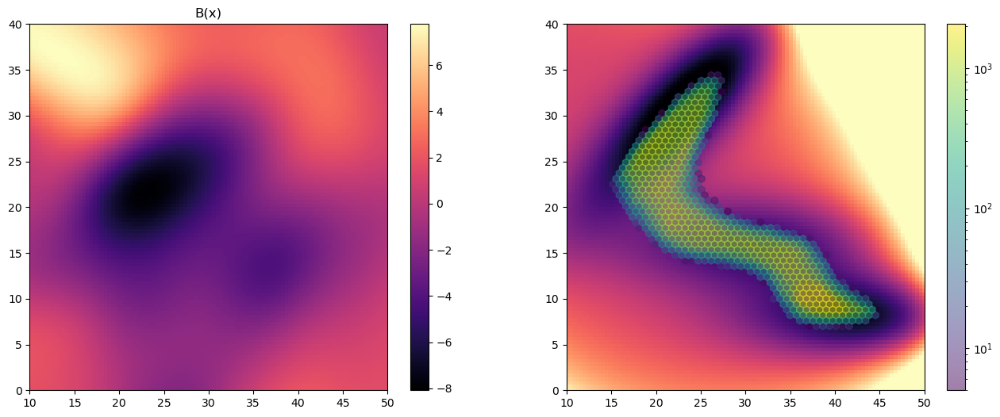

Iter:  80 l_f: 18477.9648 l_s: 2703.7294 lr:  3e-06 success:  0.80333334


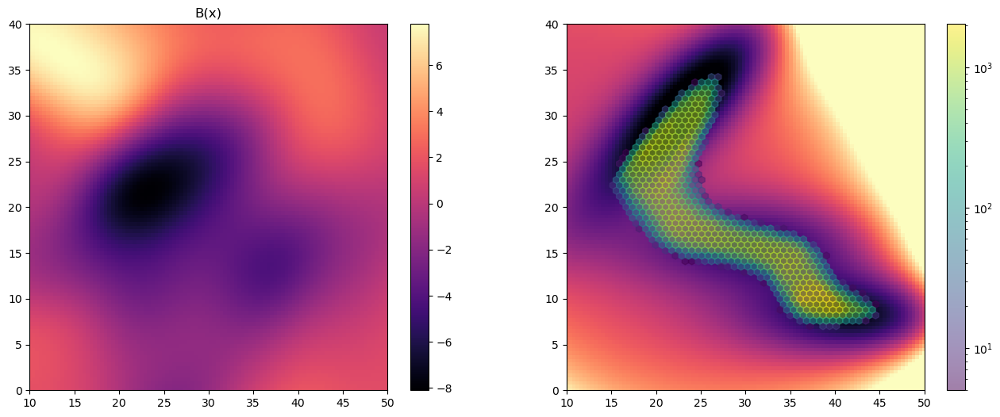

Iter:  81 l_f: 19625.0352 l_s: 3600.5756 lr:  3e-06 success:  0.82166666


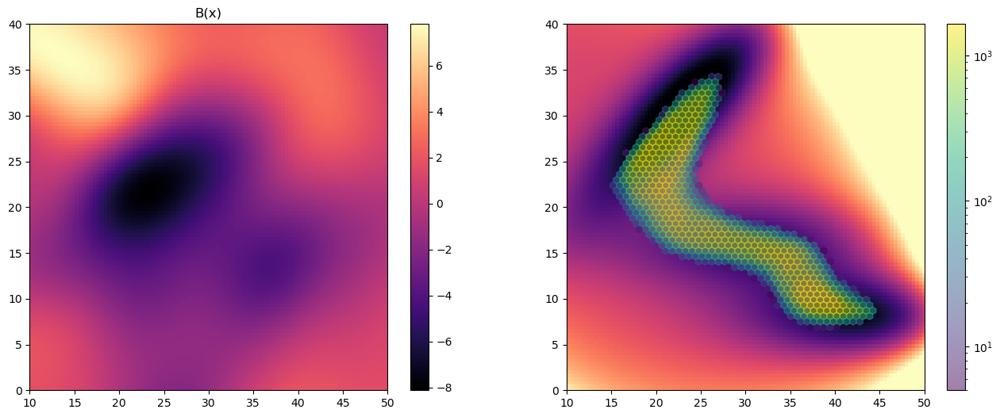

Iter:  82 l_f: 17805.256 l_s: 3679.5588 lr:  3e-06 success:  0.81


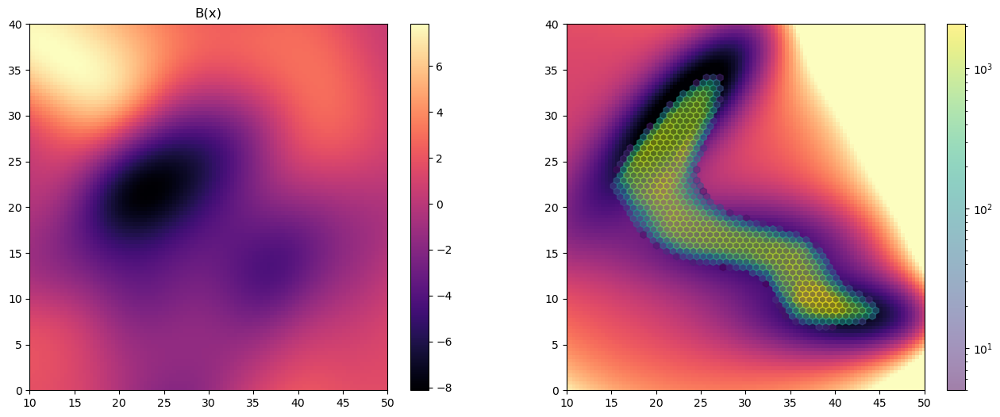

Iter:  83 l_f: 25636.1744 l_s: 2882.3626 lr:  3e-06 success:  0.78


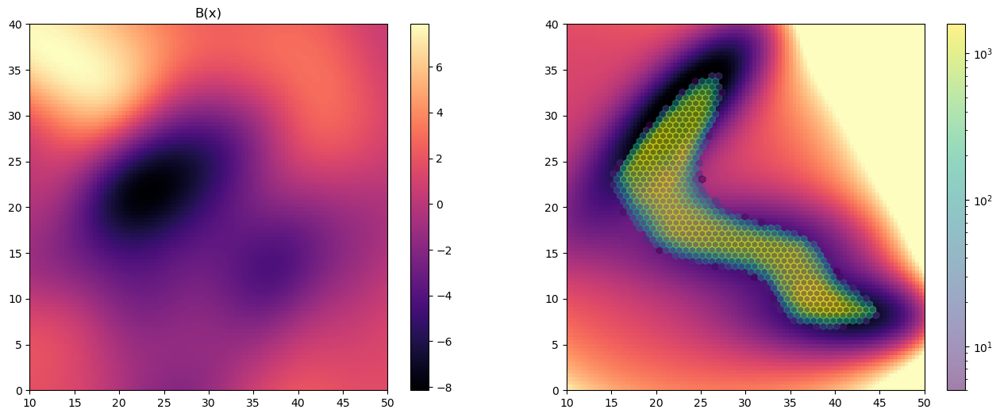

Iter:  84 l_f: 17029.4368 l_s: 3101.9912 lr:  3e-06 success:  0.82


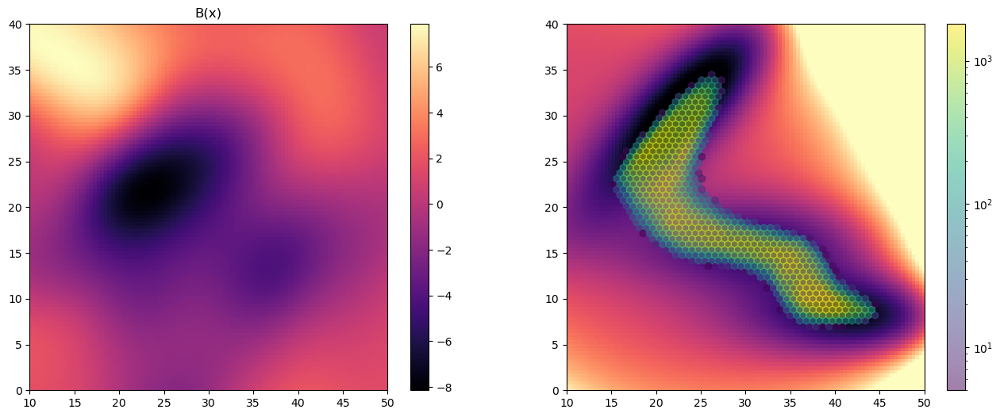

Iter:  85 l_f: 20905.056 l_s: 3479.8048 lr:  3e-06 success:  0.79833335


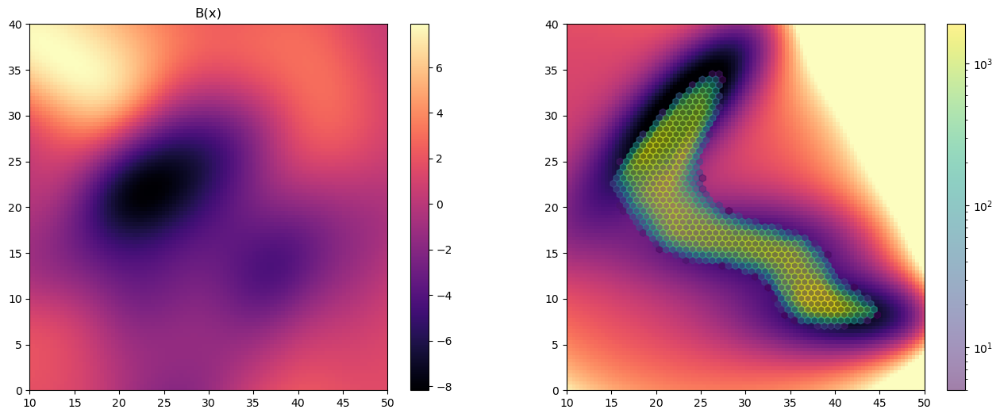

Iter:  86 l_f: 13267.0296 l_s: 3495.2628 lr:  3e-06 success:  0.8433333


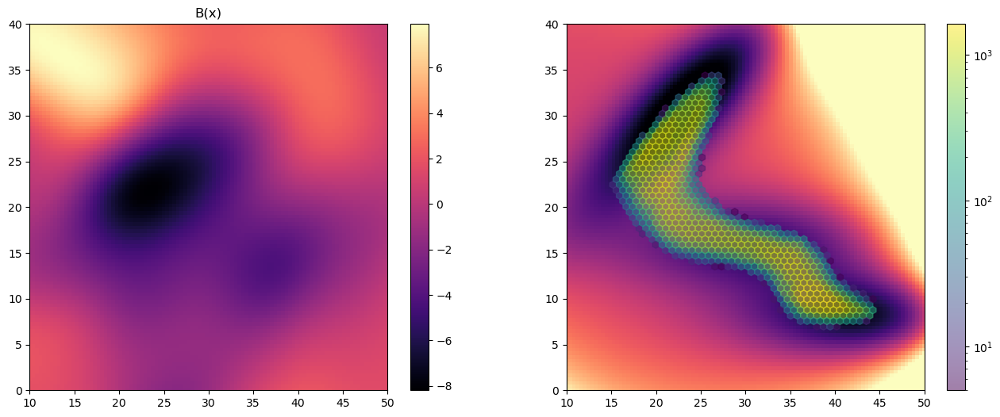

Iter:  87 l_f: 13625.7344 l_s: 3085.0908 lr:  3e-06 success:  0.81666666


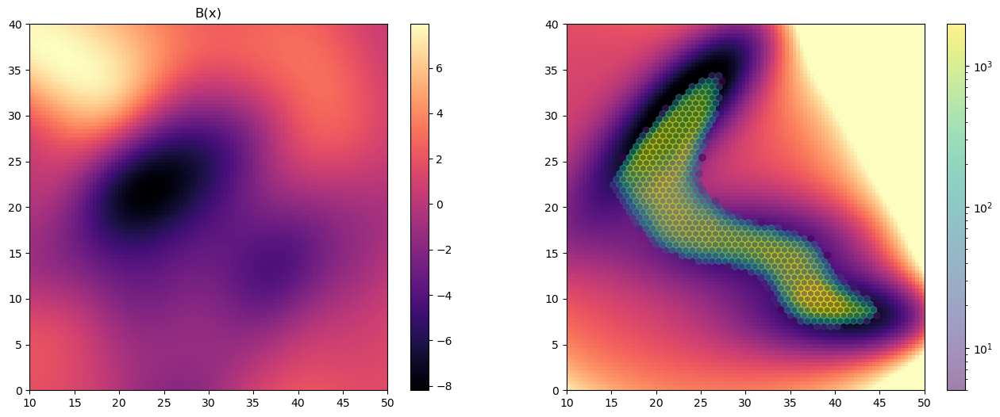

Iter:  88 l_f: 21181.6192 l_s: 4102.6132 lr:  3e-06 success:  0.80833334


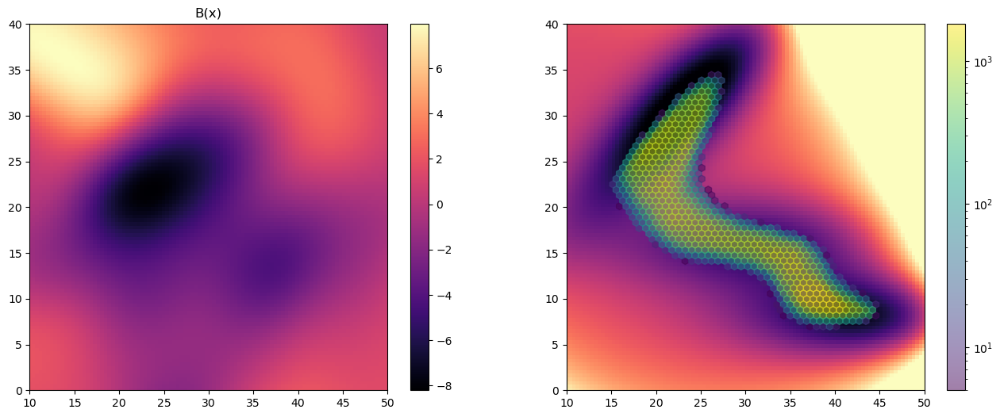

Iter:  89 l_f: 21651.856 l_s: 3364.1516 lr:  3e-06 success:  0.79


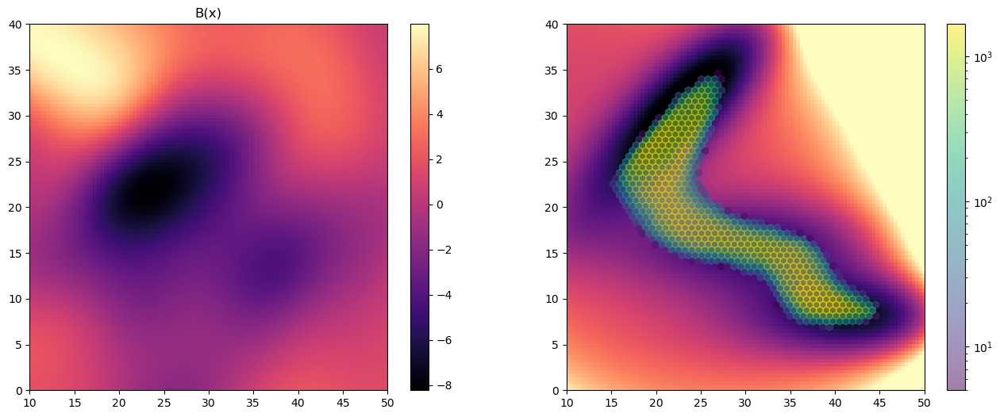

Iter:  90 l_f: 15796.1888 l_s: 4357.4888 lr:  3e-06 success:  0.81333333


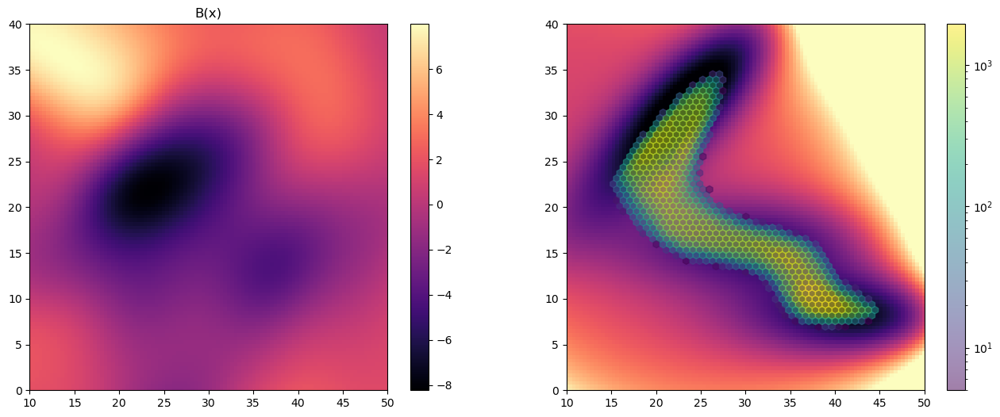

Iter:  91 l_f: 22091.5424 l_s: 2857.706 lr:  3e-06 success:  0.8066667


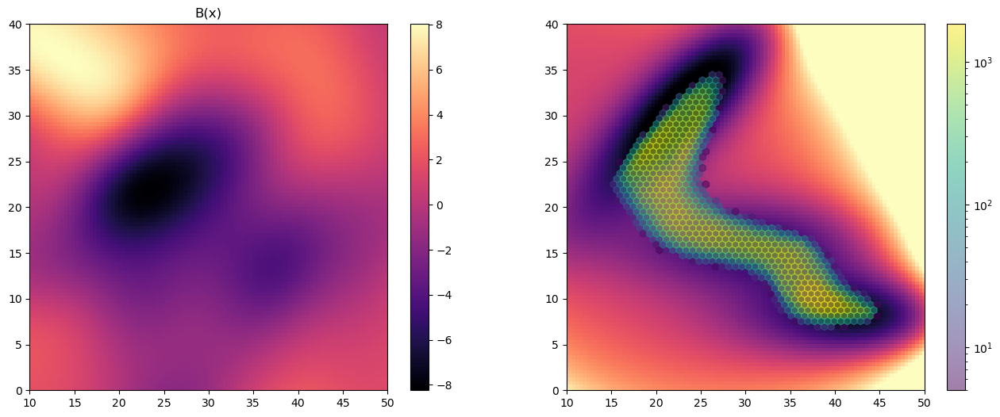

Iter:  92 l_f: 14065.5552 l_s: 4372.586 lr:  3e-06 success:  0.825


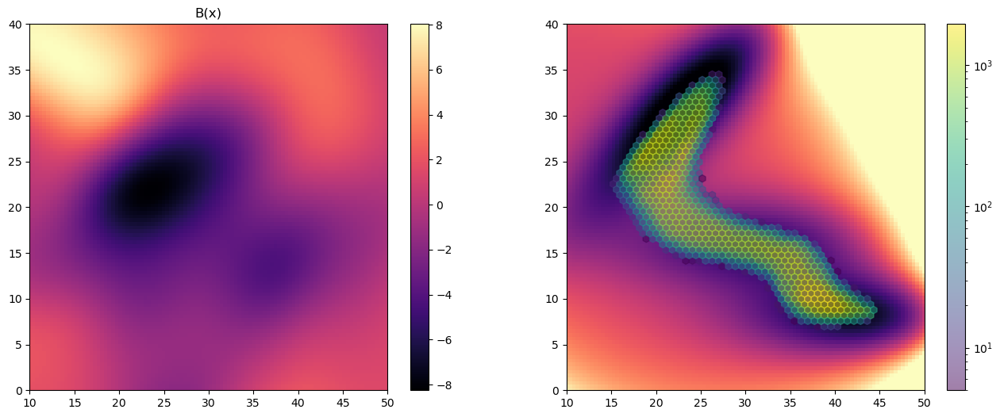

Iter:  93 l_f: 16198.496 l_s: 3216.3366 lr:  3e-06 success:  0.8283333


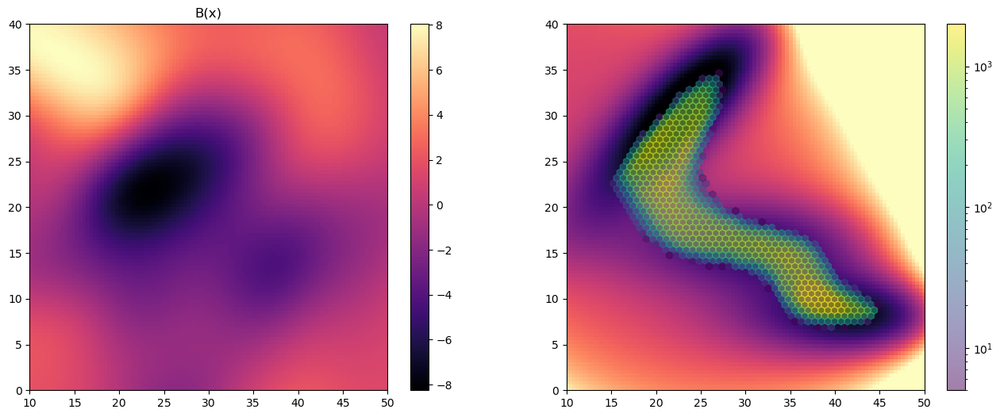

Iter:  94 l_f: 18995.2832 l_s: 3047.848 lr:  3e-06 success:  0.81666666


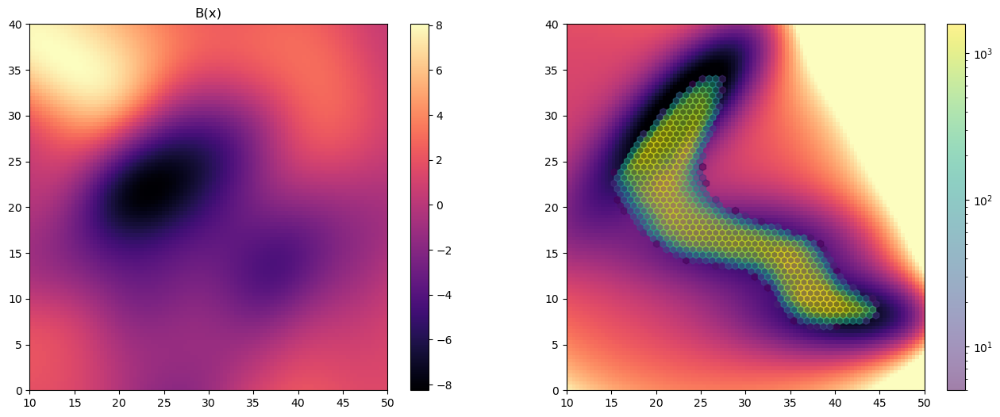

Iter:  95 l_f: 10906.4544 l_s: 3849.44 lr:  3e-06 success:  0.8516667


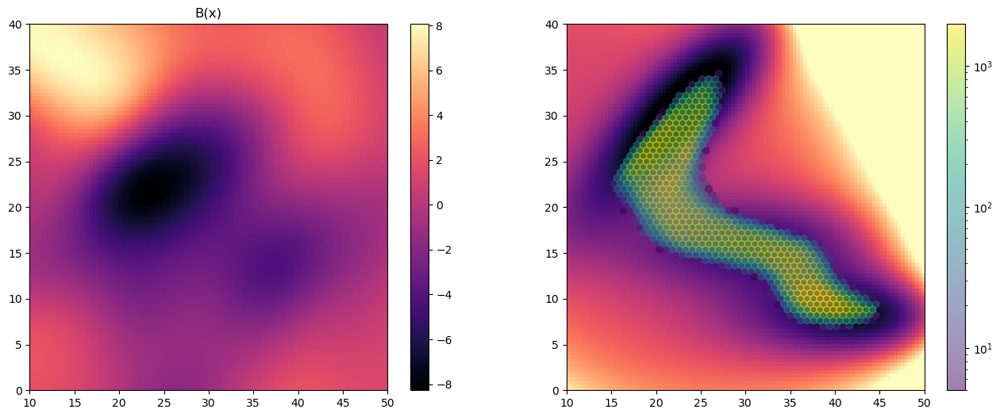

Iter:  96 l_f: 16815.9632 l_s: 2668.3292 lr:  3e-06 success:  0.8183333


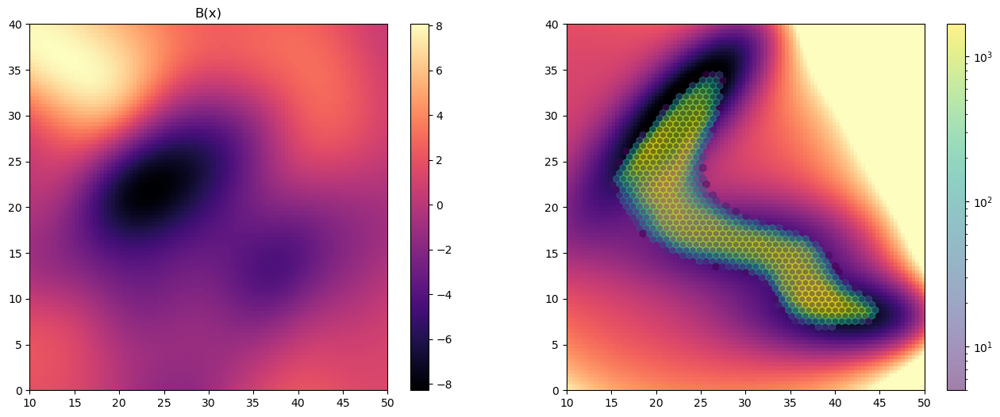

Iter:  97 l_f: 15454.344 l_s: 3291.1108 lr:  3e-06 success:  0.83666664


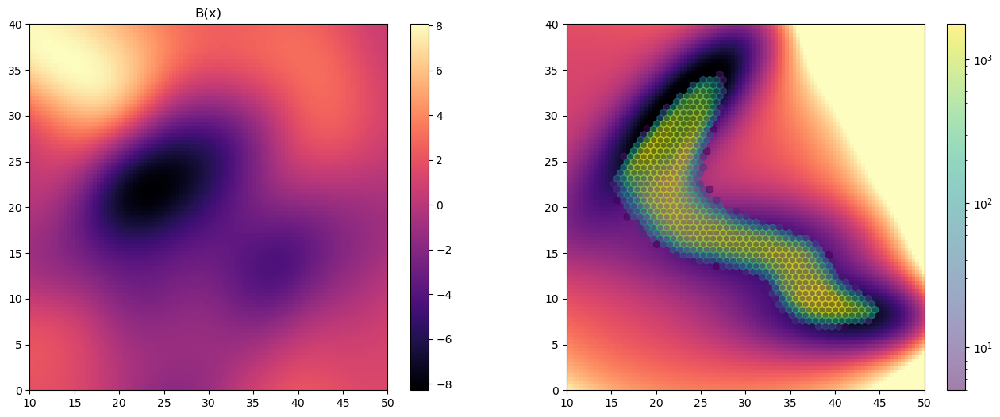

Iter:  98 l_f: 14919.0352 l_s: 3130.939 lr:  3e-06 success:  0.8383333


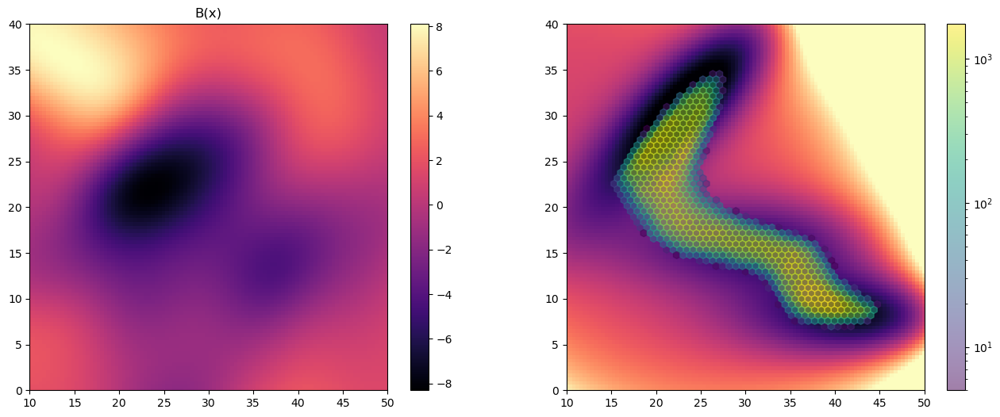

Iter:  99 l_f: 13905.1952 l_s: 4981.484 lr:  3e-06 success:  0.84833336


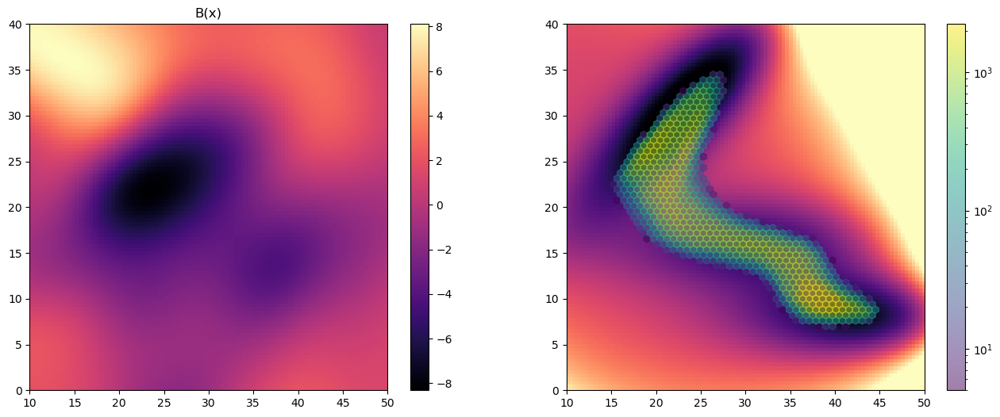

Iter:  100 l_f: 20955.4704 l_s: 3259.3052 lr:  3e-06 success:  0.8283333


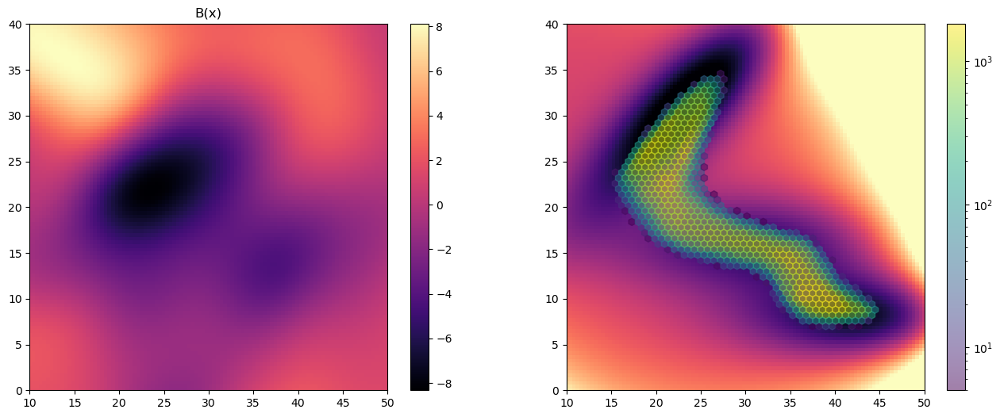

Iter:  101 l_f: 17267.4784 l_s: 3958.5176 lr:  3e-06 success:  0.82666665


In [9]:
losses_forward, losses_start, lrs, successes = [], [], [], []

#sample_bias_force.load_state_dict(torch.load(args.folder+"modelGood.pt"))
i = 0

with open(args.folder+'logs.txt', 'w') as f:
    while i < args.epochs+1:
        i = i+1
        #Get init and end point, running for a short time
        system, simulation_init, simulation_end = get_init_point()
        
        #Move to CPU for loss calculations For optimized version will stay on GPU
        simulation_init = simulation_init.cpu()
        simulation_end = simulation_end.cpu()

        #Run the main simulation loop
        trajectory, velocities_list, force_list = forward_simulate(system, vmaped_force, args)

        #Concated trajectory
        traj_tensor = torch.stack(trajectory, axis=1)
        traj_desc = coordinate_descriptors.get_descriptors(traj_tensor)        
        
        #Plot the quantities, like selected trajectories or PMF
        known_cvs = coordinate_descriptors.get_descriptors(traj_tensor)[...,project_to]


        if i % args.save_every_model == 0:
            plot_intermediate(traj_tensor, traj_desc, known_cvs, sample_bias_force, i, args, domain, potential)
            torch.save(sample_bias_force.state_dict(), args.folder+"model" + str(i) + ".pt")
        
        #Get losses
        #loss_forward, loss_start, forward_indices, 
        lf, ls, f_I, aN, s_I, aN_start, success_rate = descriptor_loss.dist_loss_adjoint(traj_tensor, simulation_end, simulation_init)

        #Scale to avoid  numerical errors
        loss_forward = lf*adjoint_multiplier
        loss_start = ls*adjoint_multiplier
        if aN is not None:
            aN = aN*adjoint_multiplier
            aN_start = aN_start*adjoint_multiplier
        
        #Print some statistics
        stats = {}
        stats["iter"] = i
        stats["loss_fwd"] = loss_forward.detach().cpu().numpy()/adjoint_multiplier
        stats["loss_s"] = loss_start.detach().cpu().numpy()/adjoint_multiplier
        stats["lr"] = scheduler.get_last_lr()[0]
        stats["success"] = success_rate.cpu().numpy()
        
        logger.write_row(stats)
        print("Iter: ", i, "l_f:", stats["loss_fwd"], "l_s:", stats["loss_s"], "lr: ", stats["lr"], "success: ", stats["success"], flush=True)
        
        
        losses_forward.append(loss_forward.detach().cpu().numpy())
        losses_start.append(loss_start.detach().cpu().numpy())
        lrs.append(scheduler.get_last_lr()[0])
        successes.append(success_rate.detach().cpu().numpy())  
        
        #Learning rate scheduling based on success rate
        if success_rate >= first_thr and not first_checkpoint:
            first_checkpoint = True
            scheduler.step()
        if success_rate > second_thr and not second_checkpoint:
            second_checkpoint = True
            scheduler.step()

            
        if args.no_adjoint:
            #Differentiate trajectory and get adjoits by full backprop. Used for testing
            intermediate_grads = torch.autograd.grad(loss_forward, force_list, retain_graph=True, create_graph=False, allow_unused=True)
            intermediate_grads_start = torch.autograd.grad(loss_start, force_list, retain_graph=False, allow_unused=True)
            adjoints = torch.stack(intermediate_grads + intermediate_grads_start, dim=1)
            
            R_tensor = traj_tensor[:,:-1].detach().repeat(1,2,1,1) 
            adjoints = adjoints.reshape(-1, *adjoints.shape[2:])
            R_tensor = R_tensor.reshape(-1, *adjoints.shape[2:])
  
            train_epoch(adjoints, R_tensor, bias_force, optimizer, n_in, args)

        else:
            #Use adjoint method to get adjoints. Memmory efficient.
            adjoints_forward, testR = get_adjoints(system, aN, traj_tensor, f_I, vmaped_vjp, system.M, args)
            adjoints_start, testR_start = get_adjoints(system, aN_start, traj_tensor, s_I, vmaped_vjp, system.M, args)

            adjoints = torch.cat((adjoints_forward.reshape(-1, *adjoints_forward.shape[2:]), adjoints_start.reshape(-1, *adjoints_start.shape[2:])))
            R_tensor = torch.cat((testR.reshape(-1,*testR.shape[2:]), testR_start.reshape(-1,*testR_start.shape[2:])))

            adjoints_filter = (adjoints.abs().sum((-1))>1e-8)
            adjoints = adjoints[adjoints_filter]
            R_tensor = R_tensor[adjoints_filter]
            
            train_epoch(adjoints, R_tensor, sample_bias_force, optimizer, args.dimension, args)



   

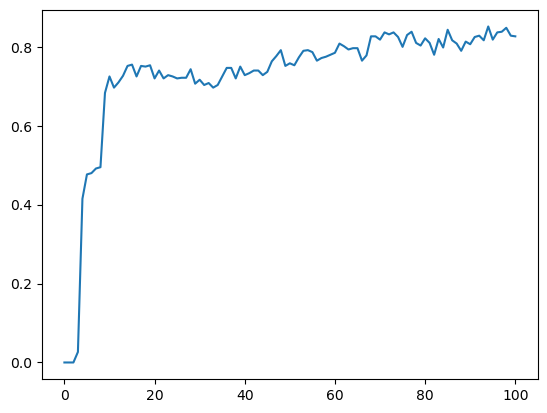

In [10]:
#Plot success rates

plt.plot(successes)
plt.show()

In [11]:
trajectory, velocities_list, force_list = forward_simulate(system, vmaped_force, args)



In [12]:
traj_tensor = torch.stack(trajectory, axis=1)
    
output_tensor = traj_tensor.reshape(-1,args.dimension)
output_tensor = output_tensor[::50,:]
print(output_tensor[::10,:].shape)
columns = ["x" + str(i+1) for i in range(output_tensor.shape[1])]
df = pd.DataFrame(output_tensor.detach().numpy(), columns=columns)
df["potential"] = potential.U(output_tensor.to(args.device)).detach().cpu()
df["bias"] = sample_bias_force.bias(output_tensor.to(args.device)).detach().cpu()

df.to_csv(args.folder+"converged_results.csv")

torch.Size([7200, 2])
